# library

In [5]:
# import libraries

# basic
import warnings
warnings.filterwarnings('ignore')

import os
import random
import pydicom
import itertools
import numpy as np
import pandas as pd
from sklearn.preprocessing import MultiLabelBinarizer
from skmultilearn.model_selection import iterative_train_test_split

# visualization
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.gridspec as gridspec

# object detection
import json
from skimage.measure import label as sk_label
from skimage.measure import regionprops as sk_regions

In [86]:
os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':4096:8'
import math
from tqdm.notebook import tqdm


# PyTorch
import torch
import torchvision
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.models.detection import FasterRCNN
from torchvision.transforms import v2
from torchvision import tv_tensors
from torchvision.tv_tensors import BoundingBoxes
from torchvision.ops import box_iou

# object detection
!pip install pycocotools
import pycocotools
from pycocotools.coco import COCO

In [68]:
# basic
import warnings
warnings.filterwarnings('ignore')

import os
import random
import numpy as np
import pandas as pd

# visualization
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
!pip install grad-cam
import pytorch_grad_cam
from pytorch_grad_cam import EigenCAM, AblationCAM
from pytorch_grad_cam.ablation_layer import AblationLayerFasterRCNN
from pytorch_grad_cam.utils.model_targets import FasterRCNNBoxScoreTarget
from pytorch_grad_cam.utils.reshape_transforms import fasterrcnn_reshape_transform
from pytorch_grad_cam.utils.image import show_cam_on_image

# PyTorch
import torch
import torchvision
from torchvision import models
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.transforms import v2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 57.3 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.4-py3-none-any.whl size=39588 sha256=17097b51a8aed9a78ce56671b071a2d85b9329ef5ea9fa18dddd95652e08b384
  Stored in directory: /root/.cache/pip/wheels/50/b0/82/1f97b5348c7fe9f0ce0ba18497202cafa5dec4562bd5292680
Successfully built grad-cam


In [116]:
from torchvision.transforms.v2 import functional as F

# configs

In [103]:
class config:
    input_ds_root = "/kaggle/input/hw05-dataset/hwk05_data" ## your own base root path
    seed = 42
    
    ## roots for training & valid
    root_working = "/kaggle/working"

    ## for test images
    test_root = '/kaggle/working/test'
    info_root_test = '/kaggle/input/hw05-dataset/hwk05_data'
    
    num_classes = 8 #(for fasterrcnn: background + # of classes): 1+7=8
    categories = ['normal', 'aortic_curvature', 'aortic_atherosclerosis_calcification', 
                  'cardiac_hypertrophy', 'intercostal_pleural_thickening', 'lung_field_infiltration', 
                  'degenerative_joint_disease_of_the_thoracic_spine', 'scoliosis']
    
    batch_size = 4
    epochs = 20
    weight_decay = 0
    lr = 1e-3
    momentum = 0.9
    workers = 4
    detection_threshold = 0.1
    iou_threshold = 0.25
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# Define funtion
## set_seed

In [8]:
def seed_everything(seed):
   
    random.seed(seed) # Set Python random seed    
    np.random.seed(seed) # Set NumPy random seed    
    torch.manual_seed(seed) # Set PyTorch random seed for CPU and GPU
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
    
    # Set PyTorch deterministic operations for cudnn backend
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    
seed_everything(config.seed)

# Check data & images
## view the train info data

In [9]:
# view the training dataframe
train_df = pd.read_csv(os.path.join(config.input_ds_root, "train.csv"), encoding="big5")
train_df

,ID,category,Width,Height,Filename,ImagePath,MarkPath
0,TDR04_20180315_075734,normal,2328,2344,220_97.dcm,/normal/image/220_97.dcm,/normal/mark/220_97.dcm.jpg
1,TDR04_20180315_080518,normal,2472,2560,220_94.dcm,/normal/image/220_94.dcm,/normal/mark/220_94.dcm.jpg
2,TDR04_20180315_081322,normal,2312,2496,220_93.dcm,/normal/image/220_93.dcm,/normal/mark/220_93.dcm.jpg
3,TDR04_20180315_081746,normal,2448,2584,220_92.dcm,/normal/image/220_92.dcm,/normal/mark/220_92.dcm.jpg
4,TDR04_20180315_082113,normal,2144,2384,220_91.dcm,/normal/image/220_91.dcm,/normal/mark/220_91.dcm.jpg
...,...,...,...,...,...,...,...
446,TDR02_20161209_161439,脊椎側彎,2376,2592,4440_5.dcm,/脊椎側彎/image/4440_5.dcm,/脊椎側彎/mark/4440_5.dcm.jpg
447,TDR04_20180224_084933,脊椎側彎,2248,2600,4440_0.dcm,/脊椎側彎/image/4440_0.dcm,/脊椎側彎/mark/4440_0.dcm.jpg
448,TDR04_20180226_082354,脊椎側彎,2488,2456,4440.dcm,/脊椎側彎/image/4440.dcm,/脊椎側彎/mark/4440.dcm.jpg
449,TDR01_20171106_095308,脊椎側彎,2320,2376,A0_29.dcm,/脊椎側彎/image/A0_29.dcm,/脊椎側彎/mark/A0_29.dcm.jpg


## 更改類別名稱為英文及修改讀取路徑文字

In [10]:
# all classes
category = {
    "心臟肥大": "cardiac_hypertrophy",
    "主動脈硬鈣化": "aortic_atherosclerosis_calcification",
    "主動脈彎曲": "aortic_curvature",
    "肺尖肋膜增厚": "intercostal_pleural_thickening",
    "肺野浸潤增加": "lung_field_infiltration",
    "胸椎退化性關節病變": "degenerative_joint_disease_of_the_thoracic_spine",
    "脊椎側彎": "scoliosis",
    "normal": "normal"
}
# change category names to English
def change_to_eng_names(df):
    
    df["category"] = df["category"].apply(lambda x: category[x])
    df["ImagePath"] = df.apply(lambda df: "/".join([df["category"], "image", df["Filename"]]), axis=1)
    df["MarkPath"] = df.apply(lambda df: "/".join([df["category"], "mark", df["Filename"] + ".jpg"]), axis=1)

change_to_eng_names(train_df)
train_df

,ID,category,Width,Height,Filename,ImagePath,MarkPath
0,TDR04_20180315_075734,normal,2328,2344,220_97.dcm,normal/image/220_97.dcm,normal/mark/220_97.dcm.jpg
1,TDR04_20180315_080518,normal,2472,2560,220_94.dcm,normal/image/220_94.dcm,normal/mark/220_94.dcm.jpg
2,TDR04_20180315_081322,normal,2312,2496,220_93.dcm,normal/image/220_93.dcm,normal/mark/220_93.dcm.jpg
3,TDR04_20180315_081746,normal,2448,2584,220_92.dcm,normal/image/220_92.dcm,normal/mark/220_92.dcm.jpg
4,TDR04_20180315_082113,normal,2144,2384,220_91.dcm,normal/image/220_91.dcm,normal/mark/220_91.dcm.jpg
...,...,...,...,...,...,...,...
446,TDR02_20161209_161439,scoliosis,2376,2592,4440_5.dcm,scoliosis/image/4440_5.dcm,scoliosis/mark/4440_5.dcm.jpg
447,TDR04_20180224_084933,scoliosis,2248,2600,4440_0.dcm,scoliosis/image/4440_0.dcm,scoliosis/mark/4440_0.dcm.jpg
448,TDR04_20180226_082354,scoliosis,2488,2456,4440.dcm,scoliosis/image/4440.dcm,scoliosis/mark/4440.dcm.jpg
449,TDR01_20171106_095308,scoliosis,2320,2376,A0_29.dcm,scoliosis/image/A0_29.dcm,scoliosis/mark/A0_29.dcm.jpg


## 畫出8種類別的第一張 image & mask 位置
這裡如果類別是 normal，就自行生成一個 shape 和原始影像相同的 mask。

In [11]:
temp = train_df[train_df["category"].duplicated() == False]
temp

,ID,category,Width,Height,Filename,ImagePath,MarkPath
0,TDR04_20180315_075734,normal,2328,2344,220_97.dcm,normal/image/220_97.dcm,normal/mark/220_97.dcm.jpg
80,TDR04_20180227_083423,aortic_curvature,2504,2536,220_14.dcm,aortic_curvature/image/220_14.dcm,aortic_curvature/mark/220_14.dcm.jpg
132,TDR01_20190313_090724,aortic_atherosclerosis_calcification,2392,2600,10_1d.dcm,aortic_atherosclerosis_calcification/image/10_...,aortic_atherosclerosis_calcification/mark/10_1...
203,TDR04_20180226_090403,cardiac_hypertrophy,2008,2280,4440.dcm,cardiac_hypertrophy/image/4440.dcm,cardiac_hypertrophy/mark/4440.dcm.jpg
236,TDR05_20151105_094209,intercostal_pleural_thickening,2296,2512,4440_4.dcm,intercostal_pleural_thickening/image/4440_4.dcm,intercostal_pleural_thickening/mark/4440_4.dcm...
265,TDR04_20180227_083423,lung_field_infiltration,2504,2536,220_3.dcm,lung_field_infiltration/image/220_3.dcm,lung_field_infiltration/mark/220_3.dcm.jpg
333,TDR04_20180227_085056,degenerative_joint_disease_of_the_thoracic_spine,2336,2360,220_15.dcm,degenerative_joint_disease_of_the_thoracic_spi...,degenerative_joint_disease_of_the_thoracic_spi...
393,TDR01_20171109_083459,scoliosis,2232,2408,A0_26.dcm,scoliosis/image/A0_26.dcm,scoliosis/mark/A0_26.dcm.jpg


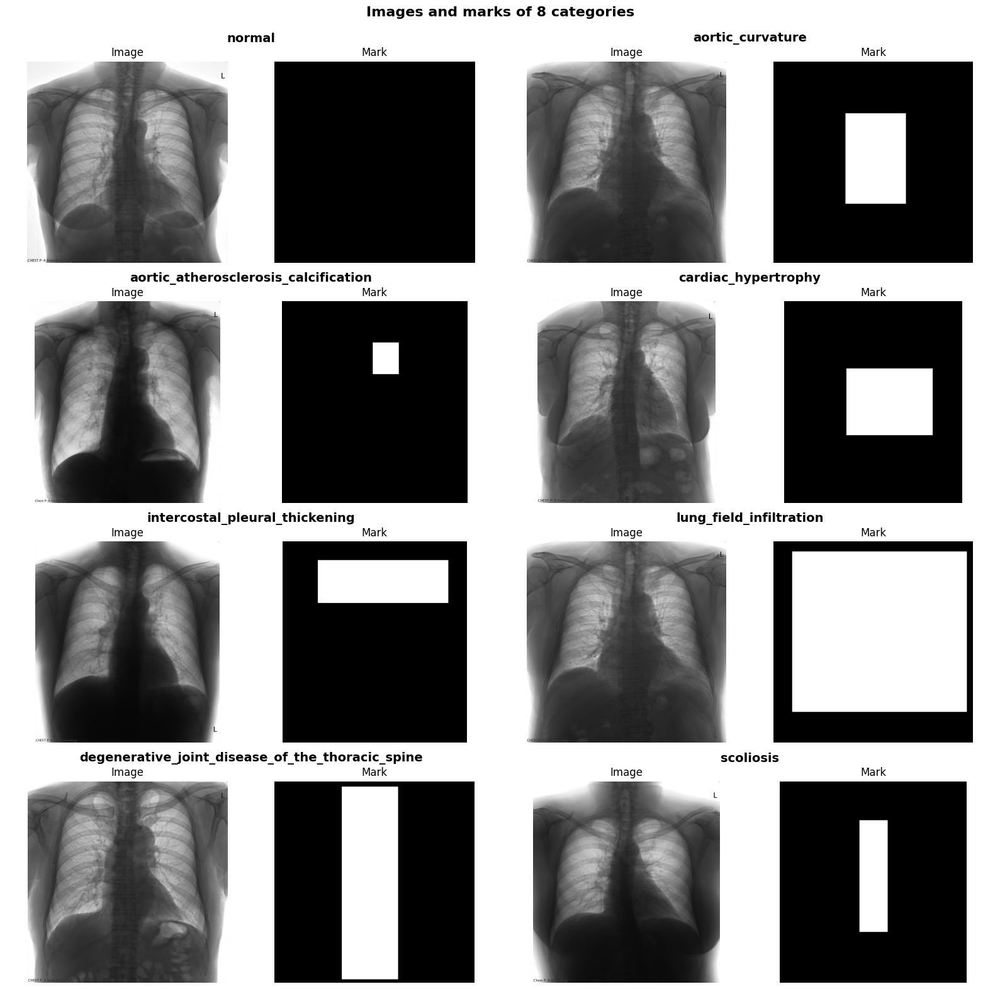

In [12]:
def plot_images_and_marks(df):
    
    temp = df[df["category"].duplicated() == False]
    
    rows, cols = 4, 2
    fig = plt.figure(figsize = (16, 16))
    grid = plt.GridSpec(rows, cols)
    
    for i in range(rows * cols):
        image = pydicom.dcmread(os.path.join(config.input_ds_root, "train", temp.iloc[i, 5])).pixel_array
        if temp.iloc[i, 1] != "normal":
            mark = np.array(Image.open(os.path.join(config.input_ds_root, "train", temp.iloc[i, 6])))
        # 這裡如果類別是 normal，就自行生成一個 shape 和原始影像相同的 mask 全黑的標記（用 0 填充的矩陣）
        else:
            mark = np.zeros((image.shape[0], image.shape[1]))
        
        categories = fig.add_subplot(grid[i])
        categories.set_title(f"{temp.iloc[i, 1]}\n", fontweight = 'semibold', size = 14)
        categories.set_axis_off()
        
        gs = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec = grid[i])
        
        ax = fig.add_subplot(gs[0])
        ax.imshow(image, cmap = "gray")
        ax.set_title("Image")
        ax.axis("off")
        
        ax = fig.add_subplot(gs[1], sharey = ax)
        ax.imshow(mark, cmap = "gray")
        ax.set_title("Mark")
        ax.axis("off")
        
    fig.patch.set_facecolor('white')
    fig.suptitle("Images and marks of 8 categories\n", fontweight = 'bold', size = 16)
    fig.tight_layout()
      
plot_images_and_marks(train_df)

# X-ray image normalization
這部分需完成 intensity log-transformation 跟 simplest color balance algorithm ，目的是為了轉換影像型態及調整 L & R 字樣的亮度。

In [13]:
def X_ray_normalization(dcm_file, vmin, vmax):
    # 讀取DICOM文件 x-ray
    img = pydicom.dcmread(dcm_file)
    origin = img.pixel_array.astype(np.float32)  # 原始像素值

    # 獲取需要的參數
    WW = img.WindowWidth
    WC = img.WindowCenter
    BitsStored = img.BitsStored
    
    # 計算iMin和iMax
    iMin = WC - WW / 2
    iMax = WC + WW / 2

    # 強度對數轉換
    log_img = np.copy(origin)
    log_img[log_img < iMin] = iMin
    log_img[log_img > iMax] = iMax
    log_img = -np.log((1 + log_img) / (2 ** BitsStored))

    # 簡單色彩平衡算法
    normalize_img = np.copy(log_img)
    normalize_img = (normalize_img - vmin) / (vmax - vmin)
    normalize_img[normalize_img < 0] = 0
    normalize_img[normalize_img > 1] = 1

    return origin, log_img, normalize_img

<Figure size 1600x1600 with 0 Axes>

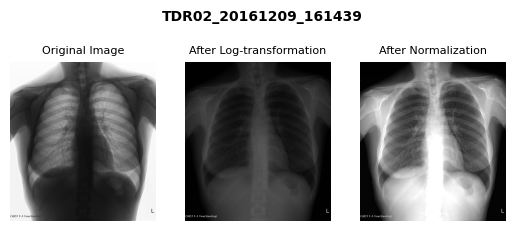

In [14]:
def plot_before_and_after(ID, df):
    
    patient_df = df[df["ID"] == ID]
    # x-ray.dcm
    path = os.path.join(config.input_ds_root, "train", patient_df.iloc[0, 5])
    origin, log_img, normalize_img = X_ray_normalization(path, vmin = 0, vmax = 2.5)
    
    plt.figure(figsize = (16, 16))
    fig, ax = plt.subplots(1, 3)
    # 對多個子圖（如 ax 的列表或陣列）執行 axis('off') 操作
    np.vectorize(lambda ax: ax.axis('off'))(ax)
    plt.subplots_adjust(wspace = None, hspace = None)
    
    ax[0].imshow(origin, cmap = "gray")
    ax[0].set_title("Original Image", size = 8)
    ax[1].imshow(log_img, cmap = "gray")
    ax[1].set_title("After Log-transformation", size = 8)
    ax[2].imshow(normalize_img, cmap = "gray")
    ax[2].set_title("After Normalization", size = 8)
          
    fig.suptitle(f"{ID}", fontweight = 'bold', size = 10, x = 0.52, y = 0.77)
    
plot_before_and_after(ID = "TDR02_20161209_161439", df = train_df)

# Mask image to bounding box
這部分將資料集中的 mask 轉換為丟入模型所需的 bounding box，並畫出8種類別的轉換後影像、轉換後影像及 bounding box，以及 mask 影像：

In [15]:
def mask_to_bbox(mark_path):
    # mark.jpg
    img = np.array(Image.open(mark_path))

    mask = img != 0
    sk_mask = sk_label(mask, connectivity = 2)
    regions = sk_regions(sk_mask)
    bboxes = []
    for region in regions:
        if region.area < 3000 :
            continue
        bboxes.append(region.bbox)

    ymin, xmin, ymax, xmax = bboxes[0]
    
    return xmin, ymin, xmax, ymax

In [16]:
# def mask_to_bbox(mark_path):
#     # mark.jpg
#     img = np.array(Image.open(mark_path))

#     mask = img != 0
#     sk_mask = sk_label(mask, connectivity = 2)
#     regions = sk_regions(sk_mask)
#     for region in regions:
#         if region.area >= 3000 :
#             ymin, xmin, ymax, xmax = region.bbox
#             break  
    
#     return xmin, ymin, xmax, ymax

接著將轉換出的 bounding box 寫入 training dataframe 中：

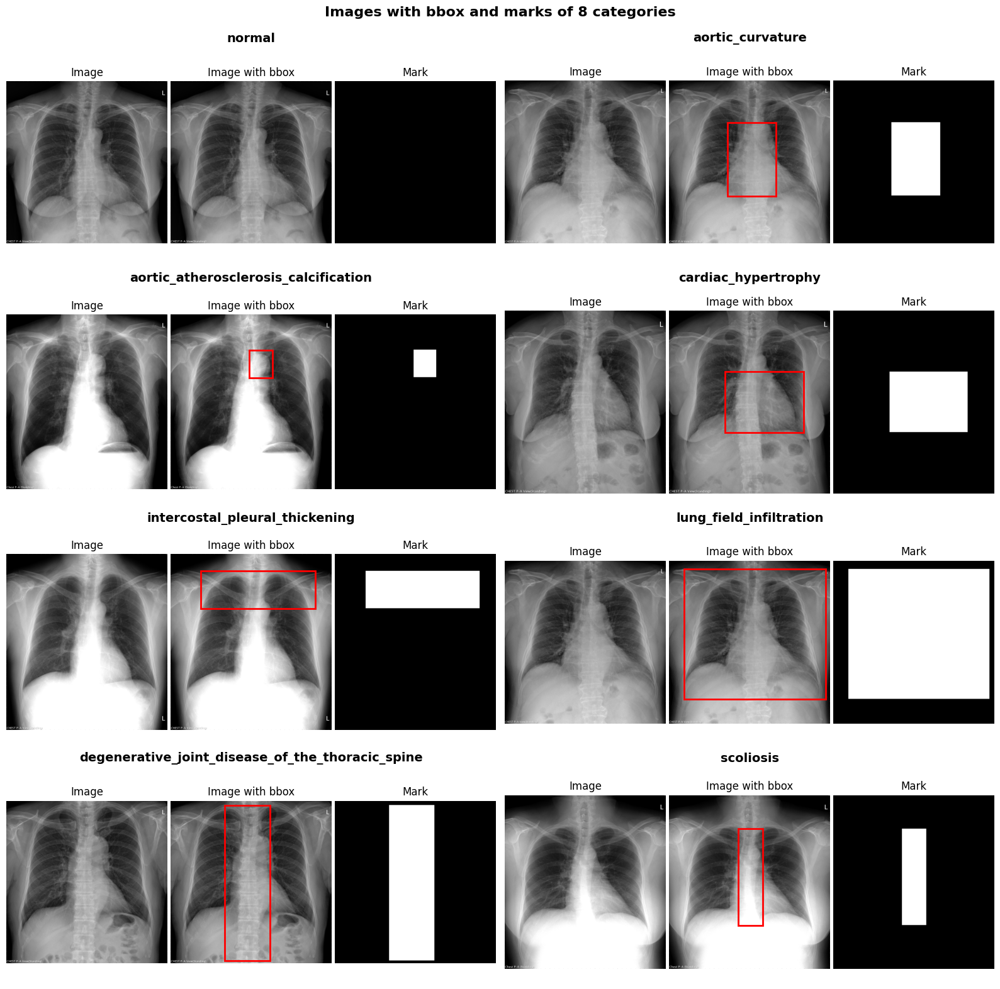

In [17]:
def plot_bbox_and_mark(df):
    
    temp = df[df["category"].duplicated() == False]
    
    rows, cols = 4, 2
    fig = plt.figure(figsize = (16, 16))
    grid = plt.GridSpec(rows, cols)
    
    for i in range(rows * cols):
        #x-ray.dcm
        path = os.path.join(config.input_ds_root, "train", temp.iloc[i, 5])
        mark_path = os.path.join(config.input_ds_root, "train", temp.iloc[i, 6])
        
        _, _, after = X_ray_normalization(path, vmin = 0, vmax = 2.5)
        
        if temp.iloc[i, 1] != "normal":
            mark = np.array(Image.open(mark_path))
            xmin, ymin, xmax, ymax = mask_to_bbox(mark_path)
        else:
            mark = np.zeros((after.shape[0], after.shape[1]))
            xmin, ymin, xmax, ymax = 0, 0, 0, 0
        
        bbox = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth = 2, 
                                 edgecolor = "r", facecolor = 'none')
        
        categories = fig.add_subplot(grid[i])
        categories.set_title(f"{temp.iloc[i, 1]}\n", fontweight = 'semibold', size = 14)
        categories.set_axis_off()
        
        gs = gridspec.GridSpecFromSubplotSpec(1, 3, subplot_spec = grid[i])
        
        ax = fig.add_subplot(gs[0])
        ax.imshow(after, cmap = "gray")
        ax.set_title("Image")
        ax.axis("off")
        
        ax = fig.add_subplot(gs[1], sharey = ax)
        ax.imshow(after, cmap = "gray")
        ax.add_patch(bbox)
        ax.set_title("Image with bbox")
        ax.axis("off")
        
        ax = fig.add_subplot(gs[2], sharey = ax)
        ax.imshow(mark, cmap = "gray")
        ax.set_title("Mark")
        ax.axis("off")
        
    # fig.patch.set_facecolor('white')
    fig.suptitle("Images with bbox and marks of 8 categories\n", fontweight = 'bold', size = 16)
    fig.tight_layout()
      
plot_bbox_and_mark(train_df)

In [18]:
def write_bbox(df):
    
    all_xmin, all_ymin, all_xmax, all_ymax = [], [], [], []
    
    for i in range(df.shape[0]):
        
        if df.iloc[i, 1] != "normal":
            mark_path = os.path.join(config.input_ds_root, "train", df.iloc[i, 6])
            xmin, ymin, xmax, ymax = mask_to_bbox(mark_path)
        else:
            xmin, ymin, xmax, ymax = 0, 0, 0, 0
        
        all_xmin.append(xmin)
        all_ymin.append(ymin)
        all_xmax.append(xmax)
        all_ymax.append(ymax)
        
    df["xmin"] = all_xmin
    df["ymin"] = all_ymin
    df["xmax"] = all_xmax
    df["ymax"] = all_ymax
    
write_bbox(train_df)
train_df

,ID,category,Width,Height,Filename,ImagePath,MarkPath,xmin,ymin,xmax,ymax
0,TDR04_20180315_075734,normal,2328,2344,220_97.dcm,normal/image/220_97.dcm,normal/mark/220_97.dcm.jpg,0,0,0,0
1,TDR04_20180315_080518,normal,2472,2560,220_94.dcm,normal/image/220_94.dcm,normal/mark/220_94.dcm.jpg,0,0,0,0
2,TDR04_20180315_081322,normal,2312,2496,220_93.dcm,normal/image/220_93.dcm,normal/mark/220_93.dcm.jpg,0,0,0,0
3,TDR04_20180315_081746,normal,2448,2584,220_92.dcm,normal/image/220_92.dcm,normal/mark/220_92.dcm.jpg,0,0,0,0
4,TDR04_20180315_082113,normal,2144,2384,220_91.dcm,normal/image/220_91.dcm,normal/mark/220_91.dcm.jpg,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
446,TDR02_20161209_161439,scoliosis,2376,2592,4440_5.dcm,scoliosis/image/4440_5.dcm,scoliosis/mark/4440_5.dcm.jpg,1016,560,1432,2328
447,TDR04_20180224_084933,scoliosis,2248,2600,4440_0.dcm,scoliosis/image/4440_0.dcm,scoliosis/mark/4440_0.dcm.jpg,912,552,1408,2272
448,TDR04_20180226_082354,scoliosis,2488,2456,4440.dcm,scoliosis/image/4440.dcm,scoliosis/mark/4440.dcm.jpg,1016,464,1560,2184
449,TDR01_20171106_095308,scoliosis,2320,2376,A0_29.dcm,scoliosis/image/A0_29.dcm,scoliosis/mark/A0_29.dcm.jpg,1032,512,1384,2016


# Write class id
因之後轉換資料格式所需，我們需要把疾病類別改寫為 class_id，也就是 0 ~ 7 的數字。

In [19]:
labels = list(train_df["category"].unique())
label2class = {l: c for c, l in enumerate(labels)}
label2class

{'normal': 0,
 'aortic_curvature': 1,
 'aortic_atherosclerosis_calcification': 2,
 'cardiac_hypertrophy': 3,
 'intercostal_pleural_thickening': 4,
 'lung_field_infiltration': 5,
 'degenerative_joint_disease_of_the_thoracic_spine': 6,
 'scoliosis': 7}

In [20]:
# write class_id
def write_class_id(df):
    class_id = []
    for i in range(df.shape[0]):
        class_id.append(label2class[df.iloc[i, 1]])
    df["class_id"] = class_id
    
write_class_id(train_df)
train_df

,ID,category,Width,Height,Filename,ImagePath,MarkPath,xmin,ymin,xmax,ymax,class_id
0,TDR04_20180315_075734,normal,2328,2344,220_97.dcm,normal/image/220_97.dcm,normal/mark/220_97.dcm.jpg,0,0,0,0,0
1,TDR04_20180315_080518,normal,2472,2560,220_94.dcm,normal/image/220_94.dcm,normal/mark/220_94.dcm.jpg,0,0,0,0,0
2,TDR04_20180315_081322,normal,2312,2496,220_93.dcm,normal/image/220_93.dcm,normal/mark/220_93.dcm.jpg,0,0,0,0,0
3,TDR04_20180315_081746,normal,2448,2584,220_92.dcm,normal/image/220_92.dcm,normal/mark/220_92.dcm.jpg,0,0,0,0,0
4,TDR04_20180315_082113,normal,2144,2384,220_91.dcm,normal/image/220_91.dcm,normal/mark/220_91.dcm.jpg,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
446,TDR02_20161209_161439,scoliosis,2376,2592,4440_5.dcm,scoliosis/image/4440_5.dcm,scoliosis/mark/4440_5.dcm.jpg,1016,560,1432,2328,7
447,TDR04_20180224_084933,scoliosis,2248,2600,4440_0.dcm,scoliosis/image/4440_0.dcm,scoliosis/mark/4440_0.dcm.jpg,912,552,1408,2272,7
448,TDR04_20180226_082354,scoliosis,2488,2456,4440.dcm,scoliosis/image/4440.dcm,scoliosis/mark/4440.dcm.jpg,1016,464,1560,2184,7
449,TDR01_20171106_095308,scoliosis,2320,2376,A0_29.dcm,scoliosis/image/A0_29.dcm,scoliosis/mark/A0_29.dcm.jpg,1032,512,1384,2016,7


# Split training set and validation set

這裡要注意的是，由於一張影像可能包含許多類不同疾病 ( multi-label ) ，所以在切分 training set 跟 validation set 時不能用一般的 `train_test_split` ，否則會導致類別不平衡。此外，由於一名病人在 dataframe 中可能有多筆資料，所以分的時候記得要用 ID 去分！

首先把疾病類別改寫為 one-hot encoding 形式：

In [21]:
# numbers of unique id, total sample
train_df.nunique()['ID'], train_df.shape[0]

(348, 451)

In [22]:
binarizer = MultiLabelBinarizer()
disease_id = []
for ID in train_df.ID.unique():
    diseases = []
    temp = train_df[train_df["ID"] == ID]
    diseases.extend(list(temp["class_id"]))
    disease_id.append(diseases)

one_hot = binarizer.fit_transform(disease_id)
print(one_hot)
print(one_hot.shape)

[[1 0 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 1]]
(348, 8)


In [23]:
train_ID, train_label, val_ID, val_label = iterative_train_test_split(np.expand_dims(train_df["ID"].unique(), axis = 1), one_hot, test_size = 0.2)
print("訓練集標籤分佈:", train_label.sum(axis=0))
print("驗證集標籤分佈:", val_label.sum(axis=0))
training = train_df[train_df["ID"].isin(train_ID.ravel())]
validation = train_df[train_df["ID"].isin(val_ID.ravel())]

訓練集標籤分佈: [64 42 52 26 23 54 48 46]
驗證集標籤分佈: [16 10 13  7  6 14 12 12]


# Dataset to COCO format
https://cocodataset.org/#format-data

大部分 object detection 模型要求丟入的資料格式為 Pascal VOC format 或 COCO format，這裡示範如何將資料轉換為 COCO format。

COCO dataset 包含五個部分，分別是：
* `info` : general information about the dataset
* `licenses` : license information for the images in the dataset
* `images` : a list of images in the dataset
* `annotations` : a list of annotations ( including bounding boxes ) that are present in all images in the dataset
* `categories` : a list of label categories

其中 `info` 和 `licenses` 並非必要，所以這裡我們只創建 `images`、`annotations` 和 `categories` 這三部分

In [24]:
categories = []
for l, c in label2class.items():
    if l == "normal":
        continue
    categories.append({"id": c, "name": l})

categories

[{'id': 1, 'name': 'aortic_curvature'},
 {'id': 2, 'name': 'aortic_atherosclerosis_calcification'},
 {'id': 3, 'name': 'cardiac_hypertrophy'},
 {'id': 4, 'name': 'intercostal_pleural_thickening'},
 {'id': 5, 'name': 'lung_field_infiltration'},
 {'id': 6, 'name': 'degenerative_joint_disease_of_the_thoracic_spine'},
 {'id': 7, 'name': 'scoliosis'}]

In [25]:
for image_id, img_name in enumerate(training.ID.unique()[0:5]):
    print(image_id, img_name)

0 TDR04_20180315_080518
1 TDR04_20180315_081322
2 TDR04_20180315_082557
3 TDR04_20180315_090829
4 TDR04_20180315_092348


In [26]:
# training
training[training["category"].duplicated() == False]

,ID,category,Width,Height,Filename,ImagePath,MarkPath,xmin,ymin,xmax,ymax,class_id
1,TDR04_20180315_080518,normal,2472,2560,220_94.dcm,normal/image/220_94.dcm,normal/mark/220_94.dcm.jpg,0,0,0,0,0
80,TDR04_20180227_083423,aortic_curvature,2504,2536,220_14.dcm,aortic_curvature/image/220_14.dcm,aortic_curvature/mark/220_14.dcm.jpg,904,656,1664,1799,1
132,TDR01_20190313_090724,aortic_atherosclerosis_calcification,2392,2600,10_1d.dcm,aortic_atherosclerosis_calcification/image/10_...,aortic_atherosclerosis_calcification/mark/10_1...,1168,528,1512,944,2
203,TDR04_20180226_090403,cardiac_hypertrophy,2008,2280,4440.dcm,cardiac_hypertrophy/image/4440.dcm,cardiac_hypertrophy/mark/4440.dcm.jpg,696,760,1680,1520,3
237,TDR04_20180227_081301,intercostal_pleural_thickening,2288,2568,220_6.dcm,intercostal_pleural_thickening/image/220_6.dcm,intercostal_pleural_thickening/mark/220_6.dcm.jpg,344,216,1984,888,4
265,TDR04_20180227_083423,lung_field_infiltration,2504,2536,220_3.dcm,lung_field_infiltration/image/220_3.dcm,lung_field_infiltration/mark/220_3.dcm.jpg,232,128,2432,2152,5
333,TDR04_20180227_085056,degenerative_joint_disease_of_the_thoracic_spine,2336,2360,220_15.dcm,degenerative_joint_disease_of_the_thoracic_spi...,degenerative_joint_disease_of_the_thoracic_spi...,784,64,1448,2320,6
394,TDR05_20151105_141942,scoliosis,2224,2656,4440_7.dcm,scoliosis/image/4440_7.dcm,scoliosis/mark/4440_7.dcm.jpg,904,536,1328,2296,7


In [27]:
# training[training["category"].duplicated() == False].iloc[2,5]

In [28]:
# #.dcm
# test_df = training[training["category"].duplicated() == False]
# test_dcm_path = os.path.join(config.input_ds_root, "train", test_df.iloc[2, 5])
# _, _, trans_img = X_ray_normalization(test_dcm_path, vmin = 0, vmax = 2.5)
# print(trans_img)
# plt.figure(figsize = (8, 8))
# plt.imshow(trans_img, cmap = "gray")
# plt.title("X-ray")
# plt.axis("off")


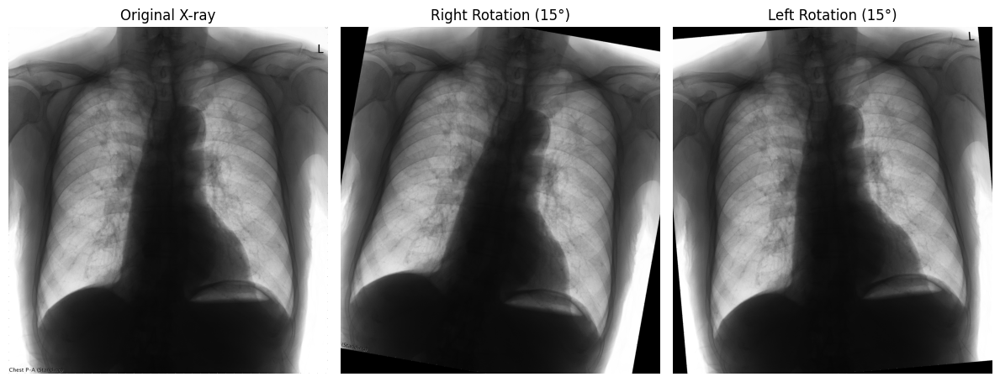

In [29]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import pydicom
import os

# 加載原始圖像
test_df = training[training["category"].duplicated() == False]
test = pydicom.dcmread(os.path.join(config.input_ds_root, "train", test_df.iloc[2, 5])).pixel_array.astype(np.float32)

# 將原始數據轉換為 PIL 圖像（必要時轉換為 8-bit）
test_image = Image.fromarray((test / np.max(test) * 255).astype(np.uint8))

# 生成旋轉圖像
rotated_right = test_image.rotate(-10)  # 向右旋轉 15 度
rotated_left = test_image.rotate(5)   # 向左旋轉 15 度

# 繪製子圖
fig, axes = plt.subplots(1, 3, figsize=(12, 8))

# 子圖 1：原始圖像
axes[0].imshow(test, cmap="gray")
axes[0].set_title("Original X-ray")
axes[0].axis("off")

# 子圖 2：向右旋轉 15 度
axes[1].imshow(rotated_right, cmap="gray")
axes[1].set_title("Right Rotation (15°)")
axes[1].axis("off")

# 子圖 3：向左旋轉 15 度
axes[2].imshow(rotated_left, cmap="gray")
axes[2].set_title("Left Rotation (15°)")
axes[2].axis("off")

# 調整布局並顯示圖像
plt.tight_layout()
plt.show()


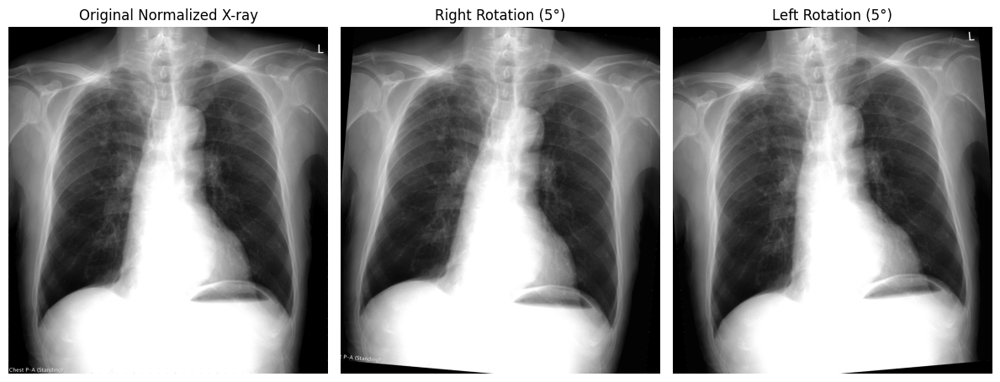

In [30]:
import numpy as np
import pydicom
import matplotlib.pyplot as plt
from PIL import Image
import os

# 測試數據
test_df = training[training["category"].duplicated() == False]
test_dcm_path = os.path.join(config.input_ds_root, "train", test_df.iloc[2, 5])

# 執行正規化
_, _, trans_img = X_ray_normalization(test_dcm_path, vmin=0, vmax=2.5)

def rotate_and_normalize(img, angle):
    # 將正規化影像轉換為 PIL 格式
    pil_img = Image.fromarray((img * 255).astype(np.uint8))

    # 旋轉影像
    rotated_img = pil_img.rotate(angle)

    # 將旋轉後的影像轉回 numpy 格式
    rotated_img_np = np.array(rotated_img).astype(np.float32)

    # 再次標準化到 [0, 1]
    normalized_rotated_img = (rotated_img_np / 255.0)
    normalized_rotated_img = np.clip(normalized_rotated_img, 0, 1)

    return normalized_rotated_img


rotated_right = rotate_and_normalize(trans_img, angle=-5)
rotated_left = rotate_and_normalize(trans_img, angle=5)

# # 保存到文本文件
# with open("rotated_right_pixels.txt", "w") as f:
#     for row in rotated_right:
#         f.write(" ".join(map(str, row)) + "\n")

# 繪製圖像
fig, axes = plt.subplots(1, 3, figsize=(12, 8))

# 原始影像
axes[0].imshow(trans_img, cmap="gray")
axes[0].set_title("Original Normalized X-ray")
axes[0].axis("off")

# 旋轉右圖
axes[1].imshow(rotated_right, cmap="gray")
axes[1].set_title("Right Rotation (5°)")
axes[1].axis("off")

# 旋轉左圖
axes[2].imshow(rotated_left, cmap="gray")
axes[2].set_title("Left Rotation (5°)")
axes[2].axis("off")

# 調整布局
plt.tight_layout()
plt.show()


In [31]:

def rotate_and_normalize(img, angle):
    # 將正規化影像轉換為 PIL 格式
    pil_img = Image.fromarray((img * 255).astype(np.uint8))

    # 旋轉影像
    rotated_img = pil_img.rotate(angle)

    # 將旋轉後的影像轉回 numpy 格式
    rotated_img_np = np.array(rotated_img).astype(np.float32)

    # 再次標準化到 [0, 1]
    normalized_rotated_img = (rotated_img_np / 255.0)
    normalized_rotated_img = np.clip(normalized_rotated_img, 0, 1)

    return normalized_rotated_img
    

def plot_bbox_and_mark_rotate(df):
    
    temp = df[df["category"].duplicated() == False]
    
    rows, cols = 8, 1
    fig = plt.figure(figsize = (16, 16))
    grid = plt.GridSpec(rows, cols)
    
    for i in range(rows * cols):
        #x-ray.dcm
        path = os.path.join(config.input_ds_root, "train", temp.iloc[i, 5])
        mark_path = os.path.join(config.input_ds_root, "train", temp.iloc[i, 6])
        
        _, _, after = X_ray_normalization(path, vmin = 0, vmax = 2.5)

        # 生成旋轉影像
        rotated_right = rotate_and_normalize(after, angle=-5)
        rotated_left = rotate_and_normalize(after, angle=5)
        
        
        if temp.iloc[i, 1] != "normal":
            mark = np.array(Image.open(mark_path))
            xmin, ymin, xmax, ymax = mask_to_bbox(mark_path)
        else:
            mark = np.zeros((after.shape[0], after.shape[1]))
            xmin, ymin, xmax, ymax = 0, 0, 0, 0
        
        bbox = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth = 2, 
                                 edgecolor = "r", facecolor = 'none')
        
        categories = fig.add_subplot(grid[i])
        categories.set_title(f"{temp.iloc[i, 1]}\n", fontweight = 'semibold', size = 14)
        categories.set_axis_off()
        
        gs = gridspec.GridSpecFromSubplotSpec(1, 6, subplot_spec = grid[i])
        
        ax = fig.add_subplot(gs[0])
        ax.imshow(after, cmap = "gray")
        ax.set_title("Image Original", size = 8)
        ax.axis("off")
        
        ax = fig.add_subplot(gs[1], sharey = ax)
        ax.imshow(after, cmap = "gray")
        ax.add_patch(bbox)
        ax.set_title("Image Original with bbox", size = 8)
        ax.axis("off")

        ax = fig.add_subplot(gs[2], sharey = ax)
        ax.imshow(rotated_left, cmap = "gray")
        ax.set_title("Image Left Rotation (5°)", size = 8)
        ax.axis("off")
        
        ax = fig.add_subplot(gs[3], sharey = ax)
        ax.imshow(rotated_left, cmap = "gray")
        ax.add_patch(bbox)
        ax.set_title("Image Left Rotation (5°) with bbox", size = 8)
        ax.axis("off")

        ax = fig.add_subplot(gs[4], sharey = ax)
        ax.imshow(rotated_right, cmap = "gray")
        ax.set_title("Image Right Rotation (5°)", size = 8)
        ax.axis("off")
        
        ax = fig.add_subplot(gs[5], sharey = ax)
        ax.imshow(rotated_right, cmap = "gray")
        ax.add_patch(bbox)
        ax.set_title("Image Right Rotation (5°) with bbox", size = 8)
        ax.axis("off")
        
       
    # fig.patch.set_facecolor('white')
    fig.suptitle("Images Rotated with bbox of 8 categories\n", fontweight = 'bold', size = 16)
    fig.tight_layout()
      
# plot_bbox_and_mark_rotate(training)

In [32]:
validation

,ID,category,Width,Height,Filename,ImagePath,MarkPath,xmin,ymin,xmax,ymax,class_id
0,TDR04_20180315_075734,normal,2328,2344,220_97.dcm,normal/image/220_97.dcm,normal/mark/220_97.dcm.jpg,0,0,0,0,0
3,TDR04_20180315_081746,normal,2448,2584,220_92.dcm,normal/image/220_92.dcm,normal/mark/220_92.dcm.jpg,0,0,0,0,0
4,TDR04_20180315_082113,normal,2144,2384,220_91.dcm,normal/image/220_91.dcm,normal/mark/220_91.dcm.jpg,0,0,0,0,0
6,TDR04_20180315_082815,normal,2384,2384,220_89.dcm,normal/image/220_89.dcm,normal/mark/220_89.dcm.jpg,0,0,0,0,0
8,TDR04_20180315_092020,normal,2152,2488,220_87.dcm,normal/image/220_87.dcm,normal/mark/220_87.dcm.jpg,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
409,TDR01_20171127_112718,scoliosis,1992,2440,A0_14.dcm,scoliosis/image/A0_14.dcm,scoliosis/mark/A0_14.dcm.jpg,776,384,1120,1872,7
412,TDR01_20171129_150244,scoliosis,2128,2432,A0_12.dcm,scoliosis/image/A0_12.dcm,scoliosis/mark/A0_12.dcm.jpg,872,488,1248,2024,7
414,TDR01_20171130_122252,scoliosis,2112,2456,A0_10.dcm,scoliosis/image/A0_10.dcm,scoliosis/mark/A0_10.dcm.jpg,920,632,1304,2000,7
416,TDR01_20171202_104940,scoliosis,2128,2664,A0_8.dcm,scoliosis/image/A0_8.dcm,scoliosis/mark/A0_8.dcm.jpg,856,432,1312,1832,7


In [33]:
# change data to coco format
def coco_format(df, categories):
    coco_output = {
        "images" : [],
        "categories" : [],
        "annotations" : []
        }
 
    coco_output['categories'] = categories

    annotation_id = 0
    for image_id, img_name in enumerate(df.ID.unique()):
        image_df = df[df.ID == img_name]
        if len(image_df) == 1:
            image_dict = {
                "file_name" : list(image_df.category)[0] + "/" + list(image_df.Filename)[0].replace(".dcm", ".jpg"), # ex.normal/220_94.jpg
                "height" : int(image_df.Height),
                "width" : int(image_df.Width),
                "id" : image_id
                }
        else:
            unique = image_df.iloc[0, :]
            image_dict = {
                "file_name" : unique.category + "/" + unique.Filename.replace(".dcm", ".jpg"),
                "height" : int(unique.Height),
                "width" : int(unique.Width),
                "id" : image_id
                }  
        coco_output['images'].append(image_dict)

        for _, row in image_df.iterrows():
            xmin = int(row.xmin)
            ymin = int(row.ymin)
            xmax = int(row.xmax)
            ymax = int(row.ymax)
            if xmin == ymin == xmax == ymax == 0:
                continue

            area = (xmax - xmin) * (ymax - ymin)
          
            poly = [
                (xmin, ymin), (xmax, ymin), 
                (xmax, ymax), (xmin, ymax)
            ]
            poly = list(itertools.chain.from_iterable(poly))

            mask_dict = {
                "id" : annotation_id,
                "image_id" : image_id,
                "category_id" : row.class_id,
                "bbox" : [xmin, ymin, (xmax - xmin), (ymax - ymin)],
                "area" : area,
                "iscrowd" : 0, 
                "segmentation" : [poly],
                }
            coco_output["annotations"].append(mask_dict)
            annotation_id += 1

    return coco_output


train_coco = coco_format(training, categories)
val_coco = coco_format(validation, categories)

In [34]:
print("coco_images ")
train_coco['images'][:5]

coco_images 


[{'file_name': 'normal/220_94.jpg', 'height': 2560, 'width': 2472, 'id': 0},
 {'file_name': 'normal/220_93.jpg', 'height': 2496, 'width': 2312, 'id': 1},
 {'file_name': 'normal/220_90.jpg', 'height': 2632, 'width': 2320, 'id': 2},
 {'file_name': 'normal/220_88.jpg', 'height': 2624, 'width': 2560, 'id': 3},
 {'file_name': 'normal/220_86.jpg', 'height': 2632, 'width': 2544, 'id': 4}]

In [35]:
print("coco_annotations ")
train_coco['annotations'][:5]
# 第65個uniqueID開始才有疾病

coco_annotations 


[{'id': 0,
  'image_id': 64,
  'category_id': 1,
  'bbox': [904, 656, 760, 1143],
  'area': 868680,
  'iscrowd': 0,
  'segmentation': [[904, 656, 1664, 656, 1664, 1799, 904, 1799]]},
 {'id': 1,
  'image_id': 64,
  'category_id': 5,
  'bbox': [232, 128, 2200, 2024],
  'area': 4452800,
  'iscrowd': 0,
  'segmentation': [[232, 128, 2432, 128, 2432, 2152, 232, 2152]]},
 {'id': 2,
  'image_id': 65,
  'category_id': 1,
  'bbox': [872, 736, 632, 1072],
  'area': 677504,
  'iscrowd': 0,
  'segmentation': [[872, 736, 1504, 736, 1504, 1808, 872, 1808]]},
 {'id': 3,
  'image_id': 65,
  'category_id': 5,
  'bbox': [144, 280, 2168, 1952],
  'area': 4231936,
  'iscrowd': 0,
  'segmentation': [[144, 280, 2312, 280, 2312, 2232, 144, 2232]]},
 {'id': 4,
  'image_id': 66,
  'category_id': 1,
  'bbox': [1024, 528, 608, 1040],
  'area': 632320,
  'iscrowd': 0,
  'segmentation': [[1024, 528, 1632, 528, 1632, 1568, 1024, 1568]]}]

# Save files

這裡將經過 normalization 處理後的影像存為 .jpg 檔，並將轉換為 COCO format後的資料存為 .json 檔，方便之後使用：

In [36]:
train_df

,ID,category,Width,Height,Filename,ImagePath,MarkPath,xmin,ymin,xmax,ymax,class_id
0,TDR04_20180315_075734,normal,2328,2344,220_97.dcm,normal/image/220_97.dcm,normal/mark/220_97.dcm.jpg,0,0,0,0,0
1,TDR04_20180315_080518,normal,2472,2560,220_94.dcm,normal/image/220_94.dcm,normal/mark/220_94.dcm.jpg,0,0,0,0,0
2,TDR04_20180315_081322,normal,2312,2496,220_93.dcm,normal/image/220_93.dcm,normal/mark/220_93.dcm.jpg,0,0,0,0,0
3,TDR04_20180315_081746,normal,2448,2584,220_92.dcm,normal/image/220_92.dcm,normal/mark/220_92.dcm.jpg,0,0,0,0,0
4,TDR04_20180315_082113,normal,2144,2384,220_91.dcm,normal/image/220_91.dcm,normal/mark/220_91.dcm.jpg,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
446,TDR02_20161209_161439,scoliosis,2376,2592,4440_5.dcm,scoliosis/image/4440_5.dcm,scoliosis/mark/4440_5.dcm.jpg,1016,560,1432,2328,7
447,TDR04_20180224_084933,scoliosis,2248,2600,4440_0.dcm,scoliosis/image/4440_0.dcm,scoliosis/mark/4440_0.dcm.jpg,912,552,1408,2272,7
448,TDR04_20180226_082354,scoliosis,2488,2456,4440.dcm,scoliosis/image/4440.dcm,scoliosis/mark/4440.dcm.jpg,1016,464,1560,2184,7
449,TDR01_20171106_095308,scoliosis,2320,2376,A0_29.dcm,scoliosis/image/A0_29.dcm,scoliosis/mark/A0_29.dcm.jpg,1032,512,1384,2016,7


In [37]:
def dcm_to_jpg(df):
    
    for path in df.ImagePath:
        dcm_path = os.path.join(config.input_ds_root, "train", path)
        _, _, image = X_ray_normalization(dcm_path, vmin = 0, vmax = 2.5)
        file = os.path.join("/kaggle/working/", path.split("/")[0])
        jpg_name = path.split("/")[-1].replace(".dcm", ".jpg")

        if os.path.isdir(file) == False:
            os.makedirs(file)

        plt.imsave(f"{file}/{jpg_name}", image, cmap = "gray")

dcm_to_jpg(train_df)

with open("train.json", "w") as outfile:
    json.dump(train_coco, outfile)
    
with open("val.json", "w") as outfile:
    json.dump(val_coco, outfile)

## Preparing for testing dataset (jpg)

In [38]:
testInfo_df = pd.read_csv("/kaggle/input/hw05-dataset/hwk05_data/test.csv", encoding="big5")
testInfo_df

,ID,Width,Height,Filename,ImagePath
0,TDR02_20161123_145314,2328,2360,001.dcm,/image/001.dcm
1,TDR01_20171106_111727,2328,2424,002.dcm,/image/002.dcm
2,TDR01_20180510_090210,2296,2432,003.dcm,/image/003.dcm
3,TDR01_20180511_092549,2392,2576,004.dcm,/image/004.dcm
4,TDR04_20180316_084316,2328,2352,005.dcm,/image/005.dcm
...,...,...,...,...,...
108,TDR04_20180223_093206,2048,2480,109.dcm,/image/109.dcm
109,TDR02_20161125_122319,2096,2296,110.dcm,/image/110.dcm
110,TDR02_20180123_115426,2400,2544,111.dcm,/image/111.dcm
111,TDR01_20180508_173616,1536,1824,112.dcm,/image/112.dcm


In [39]:
def dcm_to_jpg_test(df):
    
    for path in df.ImagePath:
        dcm_path = os.path.join(config.input_ds_root, "test", path[1:])
        _, _, image = X_ray_normalization(dcm_path, vmin = 0, vmax = 2.5)
        file = os.path.join("/kaggle/working/test")
        jpg_name = path.split("/")[-1].replace(".dcm", ".jpg")

        if os.path.isdir(file) == False:
            os.makedirs(file)

        plt.imsave(f"{file}/{jpg_name}", image, cmap = "gray")

dcm_to_jpg_test(testInfo_df)

# Object detection on medical image

為了使用 COCO API 來評估模型成效，我們會需要用到以下五個檔案，以下為 source code：

- https://raw.githubusercontent.com/pytorch/vision/main/references/detection/engine.py
- https://raw.githubusercontent.com/pytorch/vision/main/references/detection/utils.py
- https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_utils.py
- https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_eval.py
- https://raw.githubusercontent.com/pytorch/vision/main/references/detection/transforms.py

In [40]:
!wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/engine.py
!wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/utils.py
!wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_utils.py
!wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_eval.py
!wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/transforms.py
    
from engine import evaluate

--2024-12-29 11:01:47--  https://raw.githubusercontent.com/pytorch/vision/main/references/detection/engine.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4063 (4.0K) [text/plain]
Saving to: ‘engine.py’

engine.py           100%[===================>]   3.97K  --.-KB/s    in 0s      

2024-12-29 11:01:47 (60.4 MB/s) - ‘engine.py’ saved [4063/4063]

--2024-12-29 11:01:48--  https://raw.githubusercontent.com/pytorch/vision/main/references/detection/utils.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8388 (8.2K) [text/plain]
S

---

## Read data information

我們可以利用 `pycocotools` 這個套件來讀取 .json 檔案中的資料，此處簡單介紹我們所創建的 COCO dataset 所包含的三個部分： <br>
( 更詳細的介紹可閱讀[這裡](https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/md-coco-overview.html) )

### Categories

包含所有類別的 dictionary ( 不含 background ) ，每個 dictionary 中需要 2 個 key :

* `id` : 類別編號
* `name` : 類別名稱

In [41]:
annfile = config.root_working + "/train.json"
coco = COCO(annfile)
coco.cats

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


{1: {'id': 1, 'name': 'aortic_curvature'},
 2: {'id': 2, 'name': 'aortic_atherosclerosis_calcification'},
 3: {'id': 3, 'name': 'cardiac_hypertrophy'},
 4: {'id': 4, 'name': 'intercostal_pleural_thickening'},
 5: {'id': 5, 'name': 'lung_field_infiltration'},
 6: {'id': 6, 'name': 'degenerative_joint_disease_of_the_thoracic_spine'},
 7: {'id': 7, 'name': 'scoliosis'}}

### Images

影像相關資訊，一個 dictionary 含一張影像，內有 4 個 key :

* `file_name` : 影像路徑
* `height` : 影像高度
* `width` : 影像寬度
* `id` : 影像編號 ( unique  )

In [42]:
# coco.loadImgs(img_ids第幾個人的照片)
coco.loadImgs(0)

[{'file_name': 'normal/220_94.jpg', 'height': 2560, 'width': 2472, 'id': 0}]

### Annotations

標註相關資訊，一個 dictionary 只包含一個 annotation ( bounding box ) ，共有 7 個 key :

* `id` : 該 annotation 的編號
* `image_id` : 該 bounding box 所屬影像的編號
* `category_id` : 該 bounding box 所屬類別的編號
* `bbox` : bounding box 的標註資訊，格式為 $[\text{xmin}, \text{ymin}, \text{width}, \text{height}]$。$\text{xmin}$ 和 $\text{ymin}$ 表示 bounding box 左上角在影像上的座標，$\text{width}$ 和 $\text{height}$ 則為 bounding box 的寬跟高
* `area` : 每個 bounding box 所圍出的面積。
* `iscrowd` : 是單一物件 ( 0 ) 或一組物件 ( 1 )。segmentation 時使用，此處直接設為 0 即可
* `segmentation` : segmentation 時使用，可忽略

In [43]:
ann_ids = coco.getAnnIds(imgIds = 64)
coco.loadAnns(ann_ids)

[{'id': 0,
  'image_id': 64,
  'category_id': 1,
  'bbox': [904, 656, 760, 1143],
  'area': 868680,
  'iscrowd': 0,
  'segmentation': [[904, 656, 1664, 656, 1664, 1799, 904, 1799]]},
 {'id': 1,
  'image_id': 64,
  'category_id': 5,
  'bbox': [232, 128, 2200, 2024],
  'area': 4452800,
  'iscrowd': 0,
  'segmentation': [[232, 128, 2432, 128, 2432, 2152, 232, 2152]]}]

In [44]:
del coco

# Data augmentation
[TransformV2](https://pytorch.org/vision/0.20/transforms.html)

[Albumentation](https://albumentations.ai/docs/getting_started/bounding_boxes_augmentation/)


In [45]:
## TO DO: Augmentation?
class medTransform:
    def __init__(self, train=False):    
        if train:
            self.transforms = v2.Compose(
                [
                    v2.ToImage(), ## Used while using PIL image
                    v2.ToDtype(torch.float32, scale=True),
                ]
            )
        else:
            self.transforms = v2.Compose(
                [
                    v2.ToImage(), ## Used while using PIL image
                    v2.ToDtype(torch.float32, scale=True),
                ]
            )       

    def __call__(self, x, bboxes):
        if isinstance(x, torch.Tensor):
            height, width = x.shape[-2], x.shape[-1]  # (C, H, W) format
        else:  # Assuming x is a PIL Image
            width, height = x.size
        ## Loading format is COCO bboxes[x,y,w,h]
        bboxes = tv_tensors.BoundingBoxes(bboxes, format="XYWH", canvas_size=(height,width)) #canvas_size=(height, width)：指定畫布的大小，對應圖像的高度和寬度
        return self.transforms(x, bboxes) 

通過圖片思考可以做甚麼其他的 Data augmentation

# Dataset

在 Dataset 的部分，我們需要回傳的東西有兩項：image 和 target。

image 與先前作業沒有太大差異，只有讀取方式有所不同。至於 target 則是一個 dictionary，裡面需包含 5 個 key：

1. `boxes`：該影像中所有 bounding box 的標註，格式為 $[\text{xmin}, \text{ymin}, \text{xmax}, \text{ymax}]$。$\text{xmin}$ 和 $\text{ymin}$ 表示 bounding box 左上角在影像上的座標，$\text{xmax}$ 和 $\text{ymax}$ 則表示 bounding box 右下角在影像上的座標
2. `labels`：每個 bounding box 所對應的疾病類別
3. `image_id`：影像編號
4. `area`：每個 bounding box 所圍出的面積。**若 bounding box 有經過 transform，一定要記得重新計算**
5. `iscrowd`：是單一物件 ( 0 ) 或一組物件 ( 1 )。segmentation 時使用，此處直接設為 0 即可

In [46]:
class MedDataset(Dataset):
    
    def __init__(self, root, info_root, split, transforms = None):
        self.split = split
        self.root = root
        self.info_root = info_root
        self.transforms = transforms
        self.coco = COCO(os.path.join(self.info_root, f"{self.split}.json"))
        self.ids = list(sorted(self.coco.imgs.keys()))
    
    def get_image(self, img_id: int):
        image_path = os.path.join(self.root,self.coco.loadImgs(img_id)[0]['file_name'])
        image = Image.open(image_path).convert("RGB")
        return image

    def get_annotation(self, img_id: int):        
        return self.coco.loadAnns(self.coco.getAnnIds(img_id))
          
    def __getitem__(self, index):
        normal = False
        img_id = self.ids[index]
        image = self.get_image(img_id) 
        annotation = self.get_annotation(img_id)
        
        bboxes = [a['bbox']  for a in annotation]
        category_ids = [a['category_id']  for a in annotation]
        if bboxes == []:
            normal = True     
            
        if self.transforms:
            image, bboxes = self.transforms(image, bboxes)     
            
        def reformat_bboxes(boxes):
            return [[val[0], val[1], val[0] + val[2], val[1] + val[3]] for val in boxes]
        
        if normal != True:
            ## Recall that the original format is COCO
            bboxes = reformat_bboxes(bboxes)   

        def create_target(bboxes, normal):
            if normal:
                return {
                    'boxes': torch.zeros((0, 4), dtype=torch.float32),  # Empty boxes
                    'labels': torch.tensor(category_ids, dtype=torch.int64),
                    'image_id': img_id,
                    'area': torch.zeros((0,), dtype=torch.float32),  # Empty areas
                    'iscrowd': torch.zeros((0,), dtype=torch.int64),  # Empty tensor for iscrowd
                }
            else:
            
                return {
                    'boxes': torch.tensor(bboxes),
                    'labels': torch.tensor(category_ids, dtype=torch.int64),
                    'image_id': img_id,
                    'area': torch.tensor([(bbox[2] - bbox[0]) * (bbox[3] - bbox[1]) for bbox in bboxes], dtype=torch.float32),
                    'iscrowd': torch.tensor([a['iscrowd'] for a in annotation], dtype=torch.int64)
                }
       
        targets = create_target(bboxes,normal)
        return image, targets
        
    def __len__(self):
        return len(self.ids)

## Collate_fn

用於 dataloader。由於 object detection 讀取 data 的方式與先前的 classification 和 segmentation 有所不同，因此需自定義 `collate_fn`。 <br>


In [47]:
def collate_fn(batch: list[torch.tensor, dict]):
    return tuple(zip(*batch))

In [48]:
def plot_image_with_boxes(image_tensor, boxes_dict):
    image_np = image_tensor.permute(1, 2, 0).numpy()
    fig, ax = plt.subplots(1)
    # Display the image
    ax.imshow(image_np)
    for box in boxes_dict['boxes']:
        # Extract coordinates (x0, y0, x1, y1)
        x0, y0, x1, y1 = box
        # Calculate the height as (y0 - y1) since y0 is the top and y1 is the bottom
        height = y1 - y0
        # Create a rectangle patch with (x0, y0) as the top-left corner
        rect = patches.Rectangle((x0, y0), x1 - x0, height, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    plt.show()

In [49]:
train_dataset = MedDataset(root = config.root_working, info_root = config.root_working, split = "train", transforms = medTransform(train=True))
train_loader = DataLoader(train_dataset, batch_size = config.batch_size, shuffle = True,num_workers=4, collate_fn = collate_fn)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


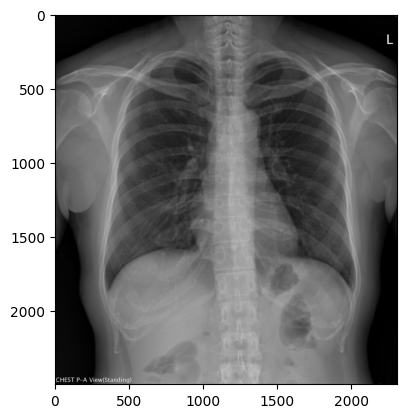

In [50]:
a,b = train_dataset.__getitem__(1)#normal
plot_image_with_boxes(a,b)

{'boxes': tensor([[ 816,  936, 1864, 1832],
        [ 144,  336, 2152, 2277]]), 'labels': tensor([3, 5]), 'image_id': 155, 'area': tensor([ 939008., 3897528.]), 'iscrowd': tensor([0, 0])}


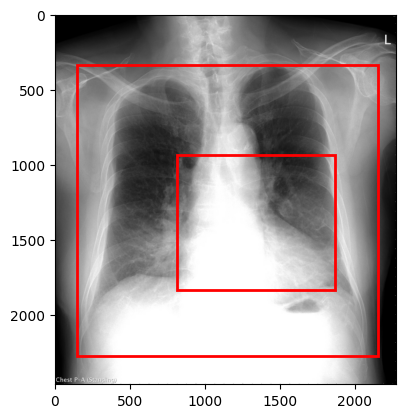

In [51]:
a,b = train_dataset.__getitem__(155)
print(b)
plot_image_with_boxes(a,b)

# Model: Faster R-CNN

這邊使用 torchvision 中內建的 Faster R-CNN 模型，並加載預訓練權重，但要記得更改 predictor 的類別數量為 8 類 ( 含 background，也就是 normal ) ，如下所示： 

In [52]:
def fasterrcnn(num_classes):
    model = models.detection.fasterrcnn_resnet50_fpn(weights='COCO_V1') 
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = None
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    
    return model

model = fasterrcnn(config.num_classes)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 197MB/s]  


# Training

在 PyTorch 的 Faster R-CNN 這個模型中，我們不須再自行定義 loss function，因為在 `model.train()` 下，`model(images, targets)` 會自動回傳訓練的 loss，其包含以下四種損失：

1. `loss_classifier`：分類器之損失
2. `loss_box_reg`：bounding box regressor 之損失
3. `loss_rpn_box_reg`：RPN 中 bounding box regressor 之損失
4. `loss_objectness`：RPN 中分類器之損失，此分類器用以判斷 bounding box 中是否包含物體

總損失為這四種 loss 的總和。

# train_one_epoch

In [53]:
def train_one_epoch(model, train_loader, optimizer, epoch, device ):
    model.train()
    
    train_loss = []
    train_loss_dict = []
    
    lr_scheduler = None

    for images, targets in tqdm(train_loader):
        images = [image.to(device) for image in images]
        targets = [{k: (torch.tensor(v,device=device) if not isinstance(v, torch.Tensor) else v.to(device)) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        batch_loss_value = losses.item()
        batch_loss_dict = {k: v.item() for k, v in loss_dict.items()}

        train_loss.append(batch_loss_value)
        train_loss_dict.append(batch_loss_dict)
      
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
    
        if lr_scheduler is not None:
            lr_scheduler.step()

    # scheduler.step()
        
    train_loss = np.mean(train_loss)    
    train_loss_dict = pd.DataFrame(train_loss_dict).mean()
    train_loss_classifier = train_loss_dict.loss_classifier
    train_loss_box_reg = train_loss_dict.loss_box_reg
    train_loss_rpn_box_reg = train_loss_dict.loss_rpn_box_reg
    train_loss_objectness = train_loss_dict.loss_objectness

    return train_loss, train_loss_classifier, train_loss_box_reg, train_loss_rpn_box_reg, train_loss_objectness

# validation
在此模型中，若設定 `model.eval()`，只會返回預測的 bounding box、confidence score 和該 bounding box 的 label。

為了取得 validation set 的 loss 以選出最好的模型，這裡我在進行 validation 時使用 `model.train()`。如果要這麼做，需要把模型中的 batch normalization 和 dropout 的係數固定住，但因 Faster R-CNN 中不含 dropout 層，所以只需凍結 batch normalization 層的參數。

In [54]:
def validation(model, val_loader, device):
    model.train()
    #model.eval()
    for m in model.modules():
        if isinstance(m, torchvision.ops.Conv2dNormActivation):
            m.eval()
        if isinstance(m, torchvision.ops.FrozenBatchNorm2d):
            m.eval()
        if isinstance(m, torch.nn.BatchNorm2d):
            m.eval()
    val_loss = []
    val_loss_dict = []
    with torch.no_grad():
        for images, targets in tqdm(val_loader):
            images = [image.to(device) for image in images]
            targets = [{k: (torch.tensor(v,device=device) if not isinstance(v, torch.Tensor) else v.to(device)) for k, v in t.items()} for t in targets]

            loss = model(images, targets)
            total_loss = sum(l for l in loss.values())
            
            loss_value = total_loss.item()
            loss_dict = {k: v.item() for k, v in loss.items()}
            
            val_loss.append(loss_value)
            val_loss_dict.append(loss_dict)
    
    val_loss = np.mean(val_loss)
    
    val_loss_dict = pd.DataFrame(val_loss_dict).mean()
    val_loss_classifier = val_loss_dict.loss_classifier
    val_loss_box_reg = val_loss_dict.loss_box_reg
    val_loss_rpn_box_reg = val_loss_dict.loss_rpn_box_reg
    val_loss_objectness = val_loss_dict.loss_objectness
    
    return val_loss, val_loss_classifier, val_loss_box_reg, val_loss_rpn_box_reg, val_loss_objectness

In [55]:
del model
del train_dataset, train_loader

In [56]:
def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

# Main

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
start



  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 1/20 | LR: 0.001000
*****Training*****
Loss: 0.3225 | Classifier Loss: 0.2002 | Box Reg Loss: 0.0971 | RPN Box Reg Loss: 0.0093 | Objectness Loss: 0.0158
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:09  model_time: 0.5069 (0.5069)  evaluator_time: 0.0188 (0.0188)  time: 2.7408  data: 2.1817  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4395 (0.4364)  evaluator_time: 0.0069 (0.0109)  time: 0.4691  data: 0.0004  max mem: 5058
Test: Total time: 0:00:34 (0.5028 s / it)
Averaged stats: model_time: 0.4395 (0.4364)  evaluator_time: 0.0069 (0.0109)
Accumulating evaluation results...
DONE (t=0.14s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.011
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.047
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ Io

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 2/20 | LR: 0.001000
*****Training*****
Loss: 0.2227 | Classifier Loss: 0.1092 | Box Reg Loss: 0.0992 | RPN Box Reg Loss: 0.0075 | Objectness Loss: 0.0067
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:37  model_time: 0.4592 (0.4592)  evaluator_time: 0.0238 (0.0238)  time: 3.1503  data: 2.6440  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4691 (0.4659)  evaluator_time: 0.0091 (0.0201)  time: 0.5303  data: 0.0003  max mem: 5058
Test: Total time: 0:00:37 (0.5476 s / it)
Averaged stats: model_time: 0.4691 (0.4659)  evaluator_time: 0.0091 (0.0201)
Accumulating evaluation results...
DONE (t=0.22s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.061
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.188
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.024
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ Io

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 3/20 | LR: 0.001000
*****Training*****
Loss: 0.2103 | Classifier Loss: 0.0993 | Box Reg Loss: 0.0980 | RPN Box Reg Loss: 0.0067 | Objectness Loss: 0.0063
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:34  model_time: 0.4879 (0.4879)  evaluator_time: 0.0101 (0.0101)  time: 3.1065  data: 2.5838  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4773 (0.4568)  evaluator_time: 0.0068 (0.0081)  time: 0.5076  data: 0.0003  max mem: 5058
Test: Total time: 0:00:36 (0.5263 s / it)
Averaged stats: model_time: 0.4773 (0.4568)  evaluator_time: 0.0068 (0.0081)
Accumulating evaluation results...
DONE (t=0.16s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.088
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.213
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.043
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ Io

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 4/20 | LR: 0.001000
*****Training*****
Loss: 0.1938 | Classifier Loss: 0.0888 | Box Reg Loss: 0.0945 | RPN Box Reg Loss: 0.0061 | Objectness Loss: 0.0044
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:14  model_time: 0.4964 (0.4964)  evaluator_time: 0.0183 (0.0183)  time: 2.8191  data: 2.2803  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4681 (0.4575)  evaluator_time: 0.0070 (0.0096)  time: 0.4966  data: 0.0003  max mem: 5058
Test: Total time: 0:00:36 (0.5244 s / it)
Averaged stats: model_time: 0.4681 (0.4575)  evaluator_time: 0.0070 (0.0096)
Accumulating evaluation results...
DONE (t=0.19s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.120
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.272
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.077
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ Io

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 5/20 | LR: 0.001000
*****Training*****
Loss: 0.1747 | Classifier Loss: 0.0799 | Box Reg Loss: 0.0846 | RPN Box Reg Loss: 0.0058 | Objectness Loss: 0.0044
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:51  model_time: 0.5064 (0.5064)  evaluator_time: 0.0277 (0.0277)  time: 3.3542  data: 2.7954  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4805 (0.4544)  evaluator_time: 0.0068 (0.0086)  time: 0.5051  data: 0.0003  max mem: 5058
Test: Total time: 0:00:36 (0.5277 s / it)
Averaged stats: model_time: 0.4805 (0.4544)  evaluator_time: 0.0068 (0.0086)
Accumulating evaluation results...
DONE (t=0.17s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.146
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.335
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.090
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ Io

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 6/20 | LR: 0.001000
*****Training*****
Loss: 0.1584 | Classifier Loss: 0.0741 | Box Reg Loss: 0.0750 | RPN Box Reg Loss: 0.0057 | Objectness Loss: 0.0037
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:00  model_time: 0.5160 (0.5160)  evaluator_time: 0.0492 (0.0492)  time: 2.6147  data: 2.0279  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4729 (0.4573)  evaluator_time: 0.0067 (0.0095)  time: 0.5064  data: 0.0003  max mem: 5058
Test: Total time: 0:00:35 (0.5204 s / it)
Averaged stats: model_time: 0.4729 (0.4573)  evaluator_time: 0.0067 (0.0095)
Accumulating evaluation results...
DONE (t=0.16s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.201
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.415
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.170
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ Io

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 7/20 | LR: 0.001000
*****Training*****
Loss: 0.1481 | Classifier Loss: 0.0717 | Box Reg Loss: 0.0679 | RPN Box Reg Loss: 0.0055 | Objectness Loss: 0.0030
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:30  model_time: 0.4448 (0.4448)  evaluator_time: 0.0127 (0.0127)  time: 3.0490  data: 2.5647  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4703 (0.4566)  evaluator_time: 0.0066 (0.0079)  time: 0.5038  data: 0.0003  max mem: 5058
Test: Total time: 0:00:36 (0.5257 s / it)
Averaged stats: model_time: 0.4703 (0.4566)  evaluator_time: 0.0066 (0.0079)
Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.200
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.417
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.168
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ Io

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 8/20 | LR: 0.001000
*****Training*****
Loss: 0.1392 | Classifier Loss: 0.0681 | Box Reg Loss: 0.0625 | RPN Box Reg Loss: 0.0052 | Objectness Loss: 0.0034
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:08  model_time: 0.4778 (0.4778)  evaluator_time: 0.0220 (0.0220)  time: 2.7307  data: 2.1976  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4679 (0.4548)  evaluator_time: 0.0060 (0.0077)  time: 0.5012  data: 0.0003  max mem: 5058
Test: Total time: 0:00:35 (0.5217 s / it)
Averaged stats: model_time: 0.4679 (0.4548)  evaluator_time: 0.0060 (0.0077)
Accumulating evaluation results...
DONE (t=0.14s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.257
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.467
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.258
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ Io

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 9/20 | LR: 0.001000
*****Training*****
Loss: 0.1333 | Classifier Loss: 0.0653 | Box Reg Loss: 0.0595 | RPN Box Reg Loss: 0.0050 | Objectness Loss: 0.0036
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:10  model_time: 0.4772 (0.4772)  evaluator_time: 0.0212 (0.0212)  time: 2.7543  data: 2.2260  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4805 (0.4594)  evaluator_time: 0.0059 (0.0084)  time: 0.5030  data: 0.0003  max mem: 5058
Test: Total time: 0:00:36 (0.5243 s / it)
Averaged stats: model_time: 0.4805 (0.4594)  evaluator_time: 0.0059 (0.0084)
Accumulating evaluation results...
DONE (t=0.14s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.253
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.466
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.237
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ Io

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 10/20 | LR: 0.001000
*****Training*****
Loss: 0.1292 | Classifier Loss: 0.0639 | Box Reg Loss: 0.0579 | RPN Box Reg Loss: 0.0047 | Objectness Loss: 0.0027
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:00  model_time: 0.5134 (0.5134)  evaluator_time: 0.0488 (0.0488)  time: 2.6207  data: 2.0279  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4717 (0.4599)  evaluator_time: 0.0057 (0.0081)  time: 0.4971  data: 0.0003  max mem: 5058
Test: Total time: 0:00:36 (0.5253 s / it)
Averaged stats: model_time: 0.4717 (0.4599)  evaluator_time: 0.0057 (0.0081)
Accumulating evaluation results...
DONE (t=0.14s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.305
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.528
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.306
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ I

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 11/20 | LR: 0.001000
*****Training*****
Loss: 0.1242 | Classifier Loss: 0.0617 | Box Reg Loss: 0.0548 | RPN Box Reg Loss: 0.0046 | Objectness Loss: 0.0031
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:18  model_time: 0.4850 (0.4850)  evaluator_time: 0.0165 (0.0165)  time: 2.8840  data: 2.3430  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4685 (0.4580)  evaluator_time: 0.0055 (0.0068)  time: 0.4937  data: 0.0003  max mem: 5058
Test: Total time: 0:00:36 (0.5229 s / it)
Averaged stats: model_time: 0.4685 (0.4580)  evaluator_time: 0.0055 (0.0068)
Accumulating evaluation results...
DONE (t=0.12s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.323
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.571
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.334
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ I

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 12/20 | LR: 0.001000
*****Training*****
Loss: 0.1191 | Classifier Loss: 0.0593 | Box Reg Loss: 0.0530 | RPN Box Reg Loss: 0.0044 | Objectness Loss: 0.0023
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:21  model_time: 0.4739 (0.4739)  evaluator_time: 0.0158 (0.0158)  time: 2.9242  data: 2.4107  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4717 (0.4555)  evaluator_time: 0.0056 (0.0066)  time: 0.5002  data: 0.0003  max mem: 5058
Test: Total time: 0:00:35 (0.5212 s / it)
Averaged stats: model_time: 0.4717 (0.4555)  evaluator_time: 0.0056 (0.0066)
Accumulating evaluation results...
DONE (t=0.13s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.347
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.589
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.382
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ I

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 13/20 | LR: 0.001000
*****Training*****
Loss: 0.1165 | Classifier Loss: 0.0591 | Box Reg Loss: 0.0509 | RPN Box Reg Loss: 0.0043 | Objectness Loss: 0.0023
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:30  model_time: 0.4981 (0.4981)  evaluator_time: 0.0225 (0.0225)  time: 3.0530  data: 2.5080  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4695 (0.4576)  evaluator_time: 0.0054 (0.0073)  time: 0.4983  data: 0.0003  max mem: 5058
Test: Total time: 0:00:36 (0.5254 s / it)
Averaged stats: model_time: 0.4695 (0.4576)  evaluator_time: 0.0054 (0.0073)
Accumulating evaluation results...
DONE (t=0.13s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.373
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.610
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.410
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ I

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 14/20 | LR: 0.001000
*****Training*****
Loss: 0.1136 | Classifier Loss: 0.0574 | Box Reg Loss: 0.0497 | RPN Box Reg Loss: 0.0042 | Objectness Loss: 0.0024
creating index...
index created!
Test:  [ 0/69]  eta: 0:02:59  model_time: 0.5100 (0.5100)  evaluator_time: 0.0227 (0.0227)  time: 2.6077  data: 2.0498  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4783 (0.4595)  evaluator_time: 0.0050 (0.0066)  time: 0.4947  data: 0.0003  max mem: 5058
Test: Total time: 0:00:36 (0.5228 s / it)
Averaged stats: model_time: 0.4783 (0.4595)  evaluator_time: 0.0050 (0.0066)
Accumulating evaluation results...
DONE (t=0.12s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.402
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.630
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.465
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ I

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 15/20 | LR: 0.001000
*****Training*****
Loss: 0.1099 | Classifier Loss: 0.0556 | Box Reg Loss: 0.0483 | RPN Box Reg Loss: 0.0040 | Objectness Loss: 0.0020
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:42  model_time: 0.4577 (0.4577)  evaluator_time: 0.0172 (0.0172)  time: 3.2180  data: 2.7197  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4868 (0.4561)  evaluator_time: 0.0052 (0.0065)  time: 0.5011  data: 0.0003  max mem: 5058
Test: Total time: 0:00:36 (0.5261 s / it)
Averaged stats: model_time: 0.4868 (0.4561)  evaluator_time: 0.0052 (0.0065)
Accumulating evaluation results...
DONE (t=0.13s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.426
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.646
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.519
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ I

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 16/20 | LR: 0.001000
*****Training*****
Loss: 0.1038 | Classifier Loss: 0.0526 | Box Reg Loss: 0.0448 | RPN Box Reg Loss: 0.0039 | Objectness Loss: 0.0024
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:36  model_time: 0.4423 (0.4423)  evaluator_time: 0.0208 (0.0208)  time: 3.1369  data: 2.6499  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4667 (0.4602)  evaluator_time: 0.0046 (0.0072)  time: 0.4954  data: 0.0003  max mem: 5058
Test: Total time: 0:00:36 (0.5300 s / it)
Averaged stats: model_time: 0.4667 (0.4602)  evaluator_time: 0.0046 (0.0072)
Accumulating evaluation results...
DONE (t=0.11s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.466
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.709
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.565
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ I

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 17/20 | LR: 0.001000
*****Training*****
Loss: 0.1001 | Classifier Loss: 0.0514 | Box Reg Loss: 0.0432 | RPN Box Reg Loss: 0.0039 | Objectness Loss: 0.0017
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:01  model_time: 0.4626 (0.4626)  evaluator_time: 0.0228 (0.0228)  time: 2.6280  data: 2.1201  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4727 (0.4560)  evaluator_time: 0.0051 (0.0064)  time: 0.5003  data: 0.0003  max mem: 5058
Test: Total time: 0:00:35 (0.5190 s / it)
Averaged stats: model_time: 0.4727 (0.4560)  evaluator_time: 0.0051 (0.0064)
Accumulating evaluation results...
DONE (t=0.13s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.475
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.726
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.571
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ I

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 18/20 | LR: 0.001000
*****Training*****
Loss: 0.0987 | Classifier Loss: 0.0503 | Box Reg Loss: 0.0432 | RPN Box Reg Loss: 0.0037 | Objectness Loss: 0.0015
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:10  model_time: 0.4688 (0.4688)  evaluator_time: 0.0260 (0.0260)  time: 2.7681  data: 2.2394  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4639 (0.4559)  evaluator_time: 0.0052 (0.0067)  time: 0.4940  data: 0.0003  max mem: 5058
Test: Total time: 0:00:35 (0.5192 s / it)
Averaged stats: model_time: 0.4639 (0.4559)  evaluator_time: 0.0052 (0.0067)
Accumulating evaluation results...
DONE (t=0.11s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.497
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.750
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.583
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ I

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 19/20 | LR: 0.001000
*****Training*****
Loss: 0.0939 | Classifier Loss: 0.0481 | Box Reg Loss: 0.0403 | RPN Box Reg Loss: 0.0036 | Objectness Loss: 0.0020
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:14  model_time: 0.4572 (0.4572)  evaluator_time: 0.0135 (0.0135)  time: 2.8129  data: 2.3152  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4674 (0.4571)  evaluator_time: 0.0047 (0.0061)  time: 0.4899  data: 0.0003  max mem: 5058
Test: Total time: 0:00:35 (0.5208 s / it)
Averaged stats: model_time: 0.4674 (0.4571)  evaluator_time: 0.0047 (0.0061)
Accumulating evaluation results...
DONE (t=0.11s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.534
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.780
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.618
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ I

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

Epoch: 20/20 | LR: 0.001000
*****Training*****
Loss: 0.0911 | Classifier Loss: 0.0464 | Box Reg Loss: 0.0394 | RPN Box Reg Loss: 0.0035 | Objectness Loss: 0.0017
creating index...
index created!
Test:  [ 0/69]  eta: 0:03:29  model_time: 0.4729 (0.4729)  evaluator_time: 0.0141 (0.0141)  time: 3.0344  data: 2.5234  max mem: 5058
Test:  [68/69]  eta: 0:00:00  model_time: 0.4643 (0.4571)  evaluator_time: 0.0053 (0.0061)  time: 0.4947  data: 0.0003  max mem: 5058
Test: Total time: 0:00:36 (0.5238 s / it)
Averaged stats: model_time: 0.4643 (0.4571)  evaluator_time: 0.0053 (0.0061)
Accumulating evaluation results...
DONE (t=0.11s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.551
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.789
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.660
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ I

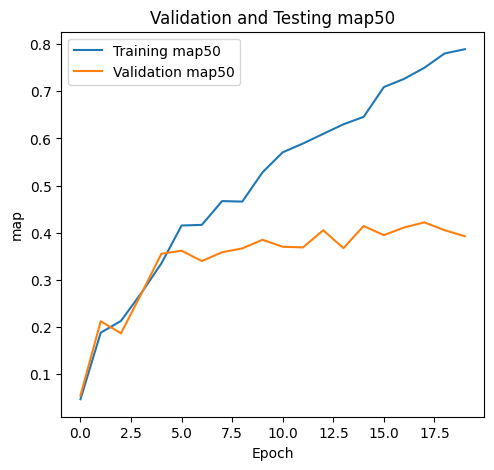

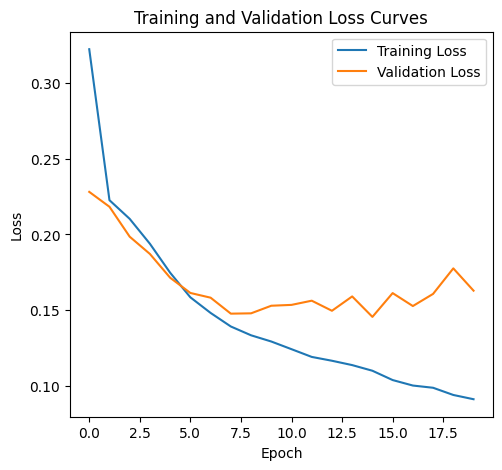

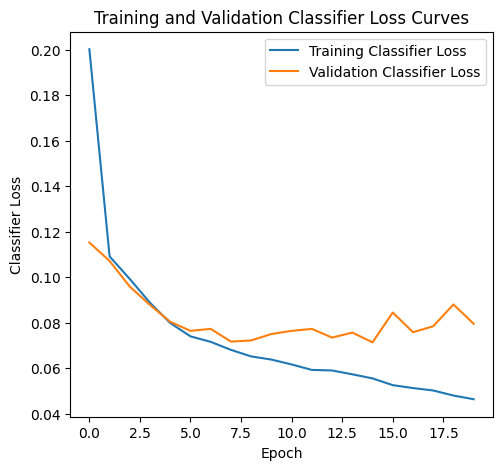

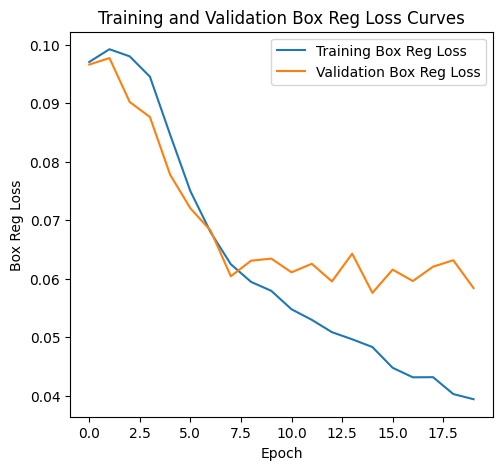

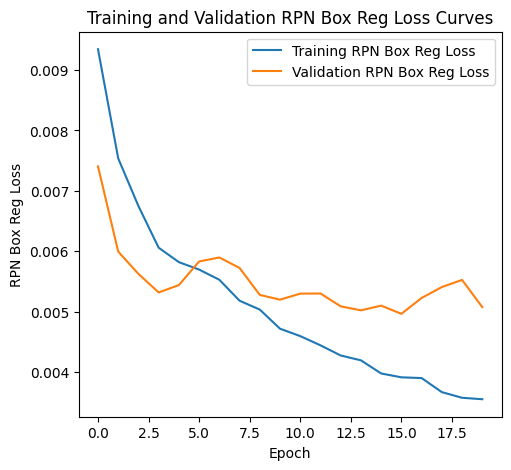

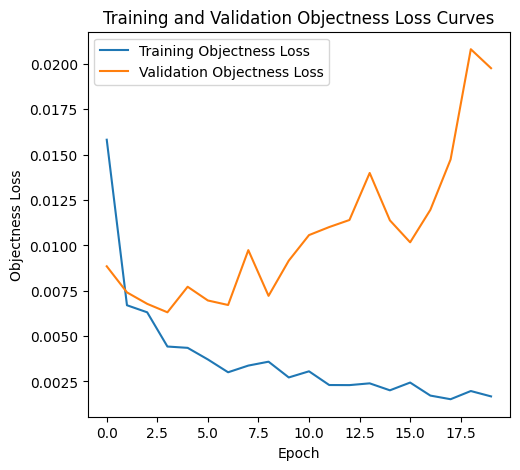

In [57]:
def main():
    
    seed_everything(config.seed)    
    g = torch.Generator()
    g.manual_seed(config.seed)
    
    train_dataset = MedDataset(root = config.root_working, info_root = config.root_working, split = "train", transforms = medTransform(train=True))
    val_dataset = MedDataset(root = config.root_working, info_root = config.root_working, split = "val",  transforms = medTransform(train=False))

    train_loader = DataLoader(train_dataset, batch_size = config.batch_size, shuffle = True,
                              num_workers=config.workers, collate_fn = collate_fn,pin_memory=True
                             )
    val_loader = DataLoader(val_dataset, batch_size = config.batch_size, shuffle = False,
                            num_workers=config.workers, worker_init_fn=seed_worker,
                            generator=g, collate_fn = collate_fn,pin_memory=True
                           )

   
    device = config.device
    model = fasterrcnn(num_classes = config.num_classes)
    model.to(device)
    
    parameters = [p for p in model.parameters() if p.requires_grad]

    optimizer = torch.optim.SGD(parameters, lr = config.lr, momentum = config.momentum, nesterov = True, weight_decay = config.weight_decay)
    # 以 batch 為單位來更新學習率
    # scheduler = torch.optim.lr_scheduler.OneCycleLR(
    #     optimizer = optimizer,
    #     epochs = config.epochs,
    #     steps_per_epoch = train_loader.__len__(),
    #     max_lr = config.lr,
    #     anneal_strategy = 'cos'
    # )
    best_val_loss = float("inf")
    best_map50 = 0.0
    history = {
        "train": {
            "loss": [],
            "loss_classifier": [],
            "loss_box_reg": [],
            "loss_rpn_box_reg": [],
            "loss_objectness": []
        },
        "val": {
            "loss": [],
            "loss_classifier": [],
            "loss_box_reg": [],
            "loss_rpn_box_reg": [],
            "loss_objectness": []
        },
        "map50":{
            "train":[],
            "valid":[],
        }
    }
    best_idx = 0
    print('start')
    for epoch in range(config.epochs):
        print()
        train_loss, train_loss_classifier, train_loss_box_reg, train_loss_rpn_box_reg, train_loss_objectness = train_one_epoch(
            model, train_loader, optimizer, epoch, device
        )
        
        val_loss, val_loss_classifier, val_loss_box_reg, val_loss_rpn_box_reg, val_loss_objectness = validation(
            model, val_loader, device
        )

        ## Training
        history["train"]["loss"].append(train_loss)
        history["train"]["loss_classifier"].append(train_loss_classifier)
        history["train"]["loss_box_reg"].append(train_loss_box_reg)
        history["train"]["loss_rpn_box_reg"].append(train_loss_rpn_box_reg)
        history["train"]["loss_objectness"].append(train_loss_objectness)
        ## Validation
        history["val"]["loss"].append(val_loss)
        history["val"]["loss_classifier"].append(val_loss_classifier)
        history["val"]["loss_box_reg"].append(val_loss_box_reg)
        history["val"]["loss_rpn_box_reg"].append(val_loss_rpn_box_reg)
        history["val"]["loss_objectness"].append(val_loss_objectness)

        
        print(f'Epoch: {epoch+1}/{config.epochs} | LR: {optimizer.state_dict()["param_groups"][0]["lr"]:.6f}')

        print("*****Training*****")
        print(f'Loss: {train_loss:.4f} | Classifier Loss: {train_loss_classifier:.4f} | Box Reg Loss: {train_loss_box_reg:.4f} | RPN Box Reg Loss: {train_loss_rpn_box_reg:.4f} | Objectness Loss: {train_loss_objectness:.4f}')
        train_evaluator = evaluate(model, train_loader, device = device)
        print("*****Validation*****")
        print(f'Loss: {val_loss:.4f} | Classifier Loss: {val_loss_classifier:.4f} | Box Reg Loss: {val_loss_box_reg:.4f} | RPN Box Reg Loss: {val_loss_rpn_box_reg:.4f} | Objectness Loss: {val_loss_objectness:.4f}')
        valid_evaluator = evaluate(model, val_loader, device = device)
        
        train_map50 = train_evaluator.coco_eval['bbox'].stats[1]
        valid_map50 = valid_evaluator.coco_eval['bbox'].stats[1]
        
        history["map50"]["train"].append(train_map50)   
        history["map50"]["valid"].append(valid_map50)        

        ## TODO save your model

        if valid_map50 > best_map50 :
            save_file = {
                "model": model.state_dict(),
                "optimizer": optimizer.state_dict(),
                "epoch": epoch,
                "args": config
            }
            best_idx = epoch
            best_map50 = valid_map50
            torch.save(save_file, os.path.join(config.root_working,"final.pth"))
        
    print(f'Best epoch in {best_idx+1}') 
    print(f'best_val_loss is {best_val_loss}')


    ## Evaluation result 
    plt.figure(figsize = (12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(config.epochs), history["map50"]["train"], label = 'Training map50')
    plt.plot(range(config.epochs), history["map50"]["valid"], label = 'Validation map50')
    plt.xlabel('Epoch')
    plt.ylabel('map')
    plt.legend()
    plt.title('Validation and Testing map50')
    plt.show()
    
    plt.figure(figsize = (12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(config.epochs), history["train"]["loss"], label = 'Training Loss')
    plt.plot(range(config.epochs), history["val"]["loss"], label = 'Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training and Validation Loss Curves')
    plt.show()
        
    plt.figure(figsize = (12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(config.epochs), history["train"]["loss_classifier"], label = 'Training Classifier Loss')
    plt.plot(range(config.epochs), history["val"]["loss_classifier"], label = 'Validation Classifier Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Classifier Loss')
    plt.legend()
    plt.title('Training and Validation Classifier Loss Curves')
    plt.show()
        
    plt.figure(figsize = (12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(config.epochs), history["train"]["loss_box_reg"], label = 'Training Box Reg Loss')
    plt.plot(range(config.epochs), history["val"]["loss_box_reg"], label = 'Validation Box Reg Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Box Reg Loss')
    plt.legend()
    plt.title('Training and Validation Box Reg Loss Curves')
    plt.show()
        
    plt.figure(figsize = (12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(config.epochs), history["train"]["loss_rpn_box_reg"], label = 'Training RPN Box Reg Loss')
    plt.plot(range(config.epochs), history["val"]["loss_rpn_box_reg"], label = 'Validation RPN Box Reg Loss')
    
    plt.xlabel('Epoch')
    plt.ylabel('RPN Box Reg Loss')
    plt.legend()
    plt.title('Training and Validation RPN Box Reg Loss Curves')
    plt.show()
        
    plt.figure(figsize = (12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(config.epochs), history["train"]["loss_objectness"], label = 'Training Objectness Loss')
    plt.plot(range(config.epochs), history["val"]["loss_objectness"], label = 'Validation Objectness Loss')

    plt.xlabel('Epoch')
    plt.ylabel('Objectness Loss')
    plt.legend()
    plt.title('Training and Validation Objectness Loss Curves')
    plt.show() 



if __name__ == "__main__":
    main()

# loading test data and model

In [58]:
def get_transform():
    
    transform = v2.Compose(
                [
                    v2.ToImage(), ## Used while using PIL image
                    #v2.ConvertBoundingBoxFormat(tv_tensors.BoundingBoxFormat.XYXY),
                    v2.ToDtype(torch.float32, scale=True),
                    
                ])       
    
    return transform


class InferenceDataset(torch.utils.data.Dataset):
    
    def __init__(self, root, df, transforms=None):
        
        self.root = root
        self.df = df
        self.transforms = transforms
        
        
    def __len__(self):
        return self.df.shape[0]
    
    def __getitem__(self,idx):
        
        image_path = os.path.join(self.root, self.df.iloc[idx,3].replace(".dcm", ".jpg"))
        image = np.array(Image.open(image_path).convert('RGB'))

        
        if self.transforms:
            image_transformed = self.transforms( image )

        # Get the ID
        ids = self.df.iloc[idx, 0]  # Adjust column index based on your CSV structure

        return image_transformed, ids  # Return both image and ID

In [63]:
# Load test information
seed_everything(config.seed) 
g = torch.Generator()
g.manual_seed(config.seed)
test_info_csv = pd.read_csv(os.path.join(config.info_root_test, "test.csv"), encoding="big5")
test_dataset = InferenceDataset(config.test_root, test_info_csv, transforms=get_transform())

test_loader = DataLoader(
    test_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=config.workers,
    worker_init_fn=seed_worker,
    generator=g,
    collate_fn=collate_fn,
    pin_memory=True,
)



# Load model
state_dict = torch.load(os.path.join(config.root_working, "final.pth"), map_location=config.device)
model = fasterrcnn(num_classes=config.num_classes)
model.load_state_dict(state_dict["model"])
model.eval().to(config.device)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

# inference

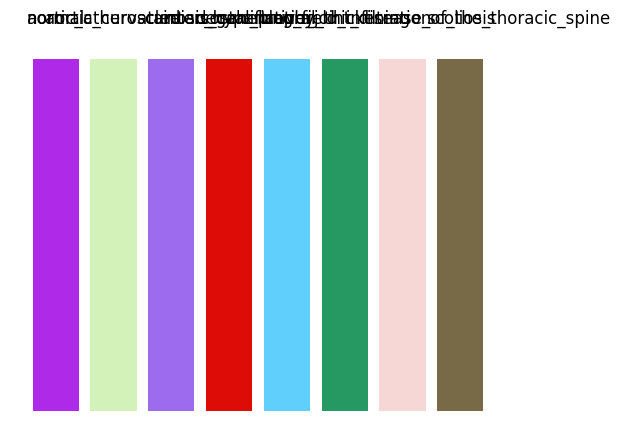

In [136]:
COLORS = np.random.uniform(0, 255, size=(len(config.categories), 3))
for i, color in enumerate(COLORS):
    plt.bar(i, 1, color=color / 255)  # Normalize color to [0, 1]
    plt.text(i, 1.1, config.categories[i], ha="center", fontsize=12)

plt.axis("off")
plt.show()

In [137]:

def draw_boxes(boxes, labels, classes, scores, image):
    for i, box in enumerate(boxes):
        # Convert RGB to BGR for OpenCV
        color = COLORS[labels[i]].astype(int)[::-1]
        
        # Draw the bounding box
        cv2.rectangle(
            image,
            (int(box[0]), int(box[1])),
            (int(box[2]), int(box[3])),
            color.tolist(), 8
        )
        
        # Increase font size and thickness for label
        font_scale = 4 # Increase this value for larger font
        thickness = 6     # Increase thickness for better visibility

        # score_text = round(scores[i], 3)
        score_text = str(round(scores[i], 4))
        # Add class label as text
        cv2.putText(image, f"{classes[i]}: {score_text}", 
                    (int(box[0]), int(box[1]) - 10),  # Adjust text position
                    cv2.FONT_HERSHEY_SIMPLEX, 
                    font_scale, 
                    color.tolist(), 
                    thickness,
                    lineType=cv2.LINE_AA)
    return image

  0%|          | 0/113 [00:00<?, ?it/s]

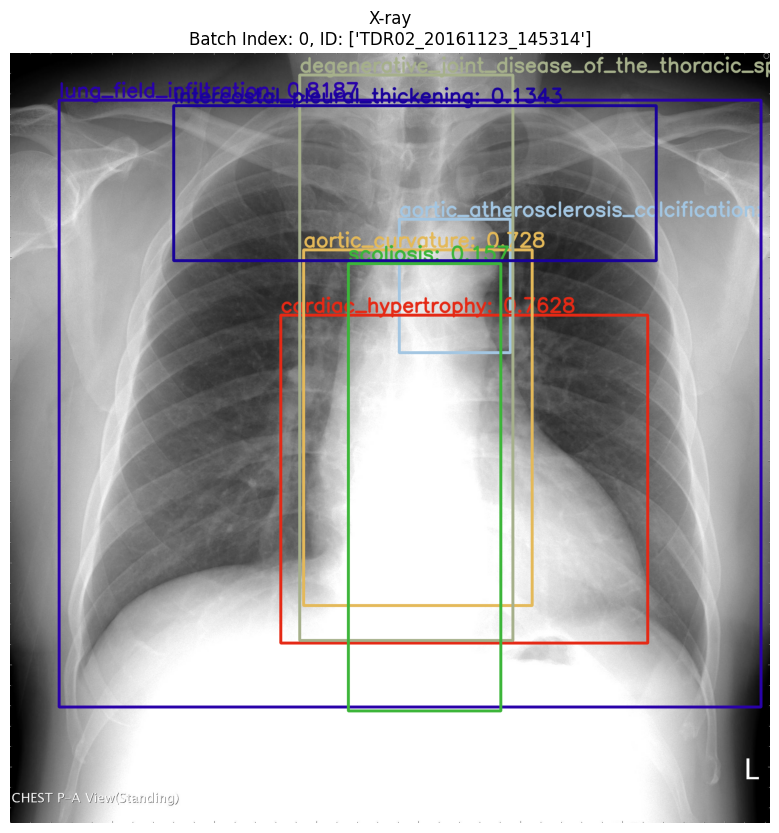

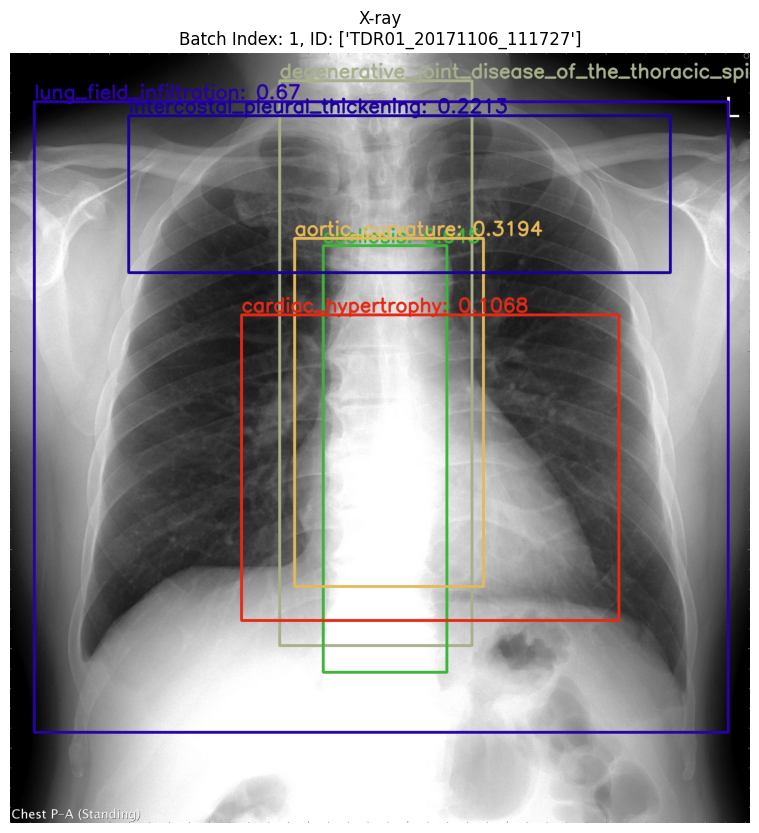

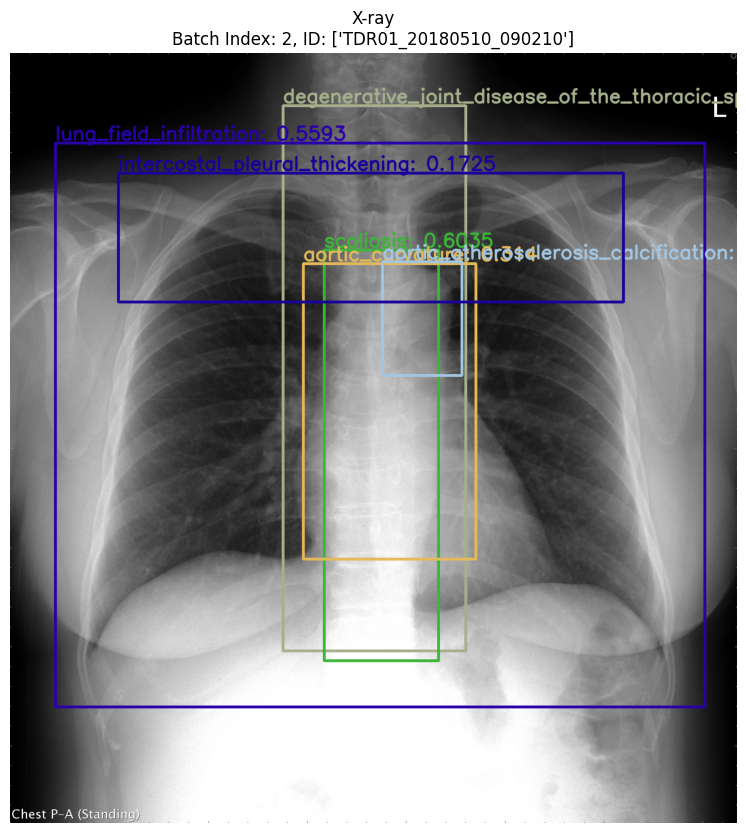

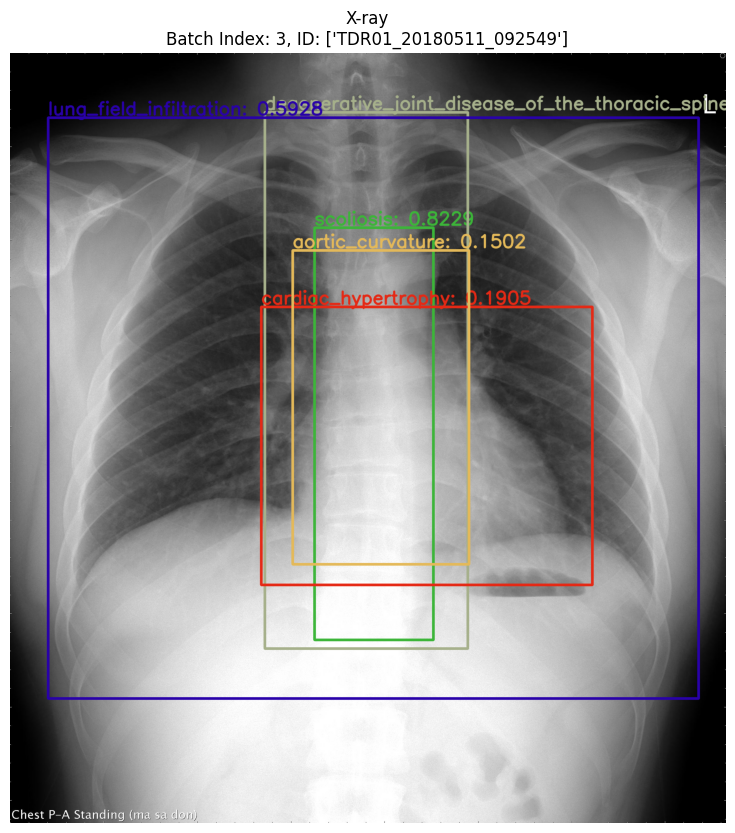

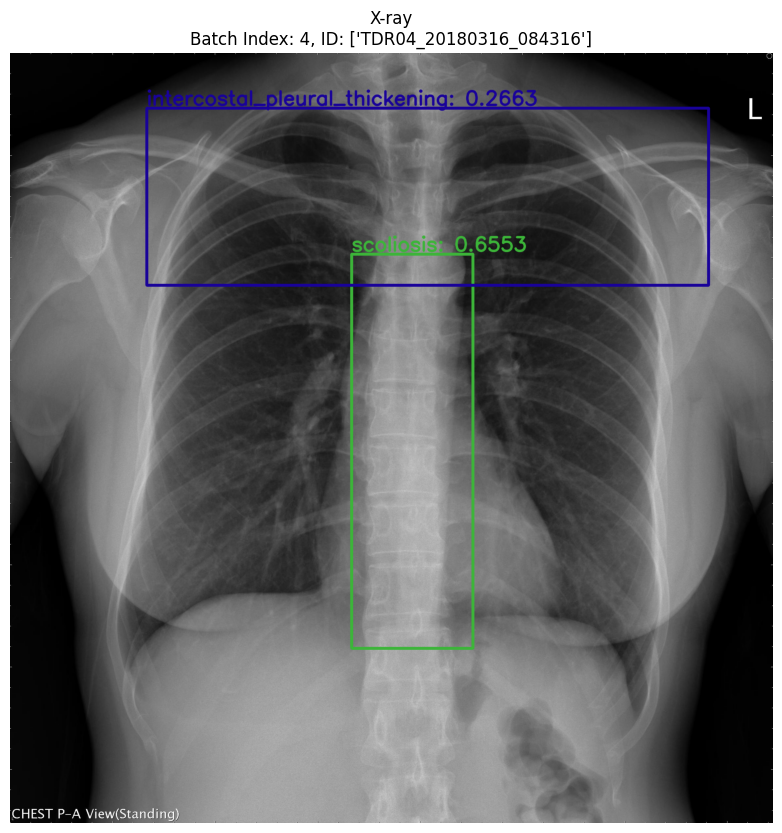

In [111]:

model.eval()
final_results = []
batch_index = 0
detection_threshold = config.detection_threshold
iou_threshold = config.iou_threshold

for batch in tqdm(test_loader):
    images, ids = batch
    # 如果 images 是 list，將其拼接為 tensor
    if isinstance(images, list):
        images = torch.stack(images, dim=0)

    images = images.to(device=config.device, dtype=torch.float)

    # Extract image dimensions from the tensor
    _, _, image_height, image_width = images.shape  # (N, C, H, W)
    # @torch.no_grad()
    outputs = model(images)

    pred_classes = [config.categories[i] for i in outputs[0]['labels'].cpu().numpy()]
    pred_labels = outputs[0]['labels'].cpu().numpy()  #0,1,2,...
    pred_scores = outputs[0]['scores'].detach().cpu().numpy()
    pred_bboxes = outputs[0]['boxes'].detach().cpu().numpy()
    

    # Remove boxes with very small width or height
    valid_indices = [
        i for i, box in enumerate(pred_bboxes)
        if (box[2] - box[0] > 2) and (box[3] - box[1] > 2)
    ]
    pred_bboxes = pred_bboxes[valid_indices]
    pred_scores = pred_scores[valid_indices]
    pred_labels = pred_labels[valid_indices]
    pred_classes = [pred_classes[i] for i in valid_indices]

    
    # Organize predictions into categories for NMS
    predictions = {}
    for index in range(len(pred_scores)):
        if pred_scores[index] >= detection_threshold:
            bbox = pred_bboxes[index].astype(np.float32)  # [x_min, y_min, x_max, y_max]
            category = pred_classes[index]

            if category not in predictions:
                predictions[category] = []
            predictions[category].append({
                "bbox": bbox,
                "score": pred_scores[index],
                "label": pred_labels[index],
            })

    # Apply NMS for each category
    results, boxes, classes, labels, indices, scores = [], [], [], [], [], []
    for category, items in predictions.items():
        # Extract bounding boxes and scores for the current category
        bboxes = np.array([item["bbox"] for item in items])
        scores_array = np.array([item["score"] for item in items])
        labels_array = np.array([item["label"] for item in items])

        # Sort by scores (descending)
        sorted_indices = np.argsort(-scores_array)
        bboxes = bboxes[sorted_indices]
        scores_array = scores_array[sorted_indices]
        # labels_array = labels_array[sorted_indices]

        # Perform NMS
        keep = []
        while len(bboxes) > 0:
            # Select the box with the highest score
            chosen_index = 0
            chosen_bbox = bboxes[chosen_index]
            chosen_score = scores_array[chosen_index]
            # chosen_label = labels_array[chosen_index]

            # Add to the kept list
            keep.append({
                "bbox": chosen_bbox,
                "score": chosen_score,
                "category": category,
                # "label": chosen_label
            })

            # Calculate IoU for remaining boxes
            ious = box_iou(torch.tensor([chosen_bbox]), torch.tensor(bboxes))[0].numpy()
            

            # Remove boxes with IoU > threshold
            to_keep = ious <= iou_threshold
            bboxes = bboxes[to_keep]
            scores_array = scores_array[to_keep]

        # Add kept boxes to results
        for item in keep:
            bbox = item["bbox"]
            score = item["score"]
            
            # Scale bounding box coordinates to [0, 1]
            scaled_bbox = {
                "xmin": bbox[0] / image_width,
                "xmax": bbox[2] / image_width,
                "ymin": bbox[1] / image_height,
                "ymax": bbox[3] / image_height,
            }

            # Create result entry
            result = {
                "category": item["category"],
                "score": score,
                "xmin": scaled_bbox["xmin"],
                "xmax": scaled_bbox["xmax"],
                "ymin": scaled_bbox["ymin"],
                "ymax": scaled_bbox["ymax"],
            }
            results.append(result)

            # Append details to output lists
            boxes.append(bbox.astype(np.int32))
            classes.append(item["category"])
            labels.append(labels_array[0])
            scores.append(score)

    

    
    # print("index:",batch_index)
    # print("id:", ids)
    # print(results)
    # print(classes)
    # print(labels)
    # print(scores)
    # print(boxes)
    
    
    
    if batch_index < 5 :
        plot_image_path = os.path.join(config.test_root,test_info_csv.iloc[batch_index,3].replace(".dcm", ".jpg"))
        plot_image = np.array(Image.open(plot_image_path).convert("RGB"))
        fig = plt.figure(figsize=(10, 10))
        image = draw_boxes(boxes, labels, classes, scores, plot_image)
        plt.imshow(image, cmap = "gray") 
        plt.title(f"X-ray\nBatch Index: {batch_index}, ID: {ids}")
        plt.axis("off")
    
    batch_index += 1
    

    for result in results:
        # Add ID column to each row
        result["ID"] = ids[0]  # Assuming batch_size=1
        final_results.append(result)
    


output_df = pd.DataFrame(final_results, columns=["ID", "category", "score", "xmin", "xmax", "ymin", "ymax"])

# Display the first 10 ,last 10 rows and the shape of your final prediction

In [112]:
output_df.head(10)

,ID,category,score,xmin,xmax,ymin,ymax
0,TDR02_20161123_145314,aortic_atherosclerosis_calcification,0.898176,0.512307,0.658211,0.215776,0.389366
1,TDR02_20161123_145314,lung_field_infiltration,0.818739,0.064639,0.988035,0.061364,0.849299
2,TDR02_20161123_145314,cardiac_hypertrophy,0.762753,0.356388,0.839279,0.340656,0.766104
3,TDR02_20161123_145314,aortic_curvature,0.728031,0.386475,0.686940,0.255791,0.717780
4,TDR02_20161123_145314,degenerative_joint_disease_of_the_thoracic_spine,0.575606,0.381184,0.661927,0.028520,0.762938
5,TDR02_20161123_145314,scoliosis,0.157038,0.445427,0.645796,0.273326,0.854550
6,TDR02_20161123_145314,intercostal_pleural_thickening,0.134314,0.215463,0.850091,0.068350,0.269651
7,TDR01_20171106_111727,degenerative_joint_disease_of_the_thoracic_spine,0.826117,0.364332,0.624164,0.036235,0.769798
8,TDR01_20171106_111727,lung_field_infiltration,0.669972,0.032659,0.970409,0.063339,0.882021
9,TDR01_20171106_111727,scoliosis,0.644997,0.423374,0.590252,0.250343,0.804067


In [113]:
output_df.tail(10)

,ID,category,score,xmin,xmax,ymin,ymax
550,TDR01_20180508_173616,lung_field_infiltration,0.277631,0.028017,0.938751,0.061455,0.788415
551,TDR01_20180508_173616,aortic_curvature,0.154427,0.366670,0.642980,0.259445,0.595809
552,TDR01_20180508_173616,intercostal_pleural_thickening,0.121241,0.168017,0.795194,0.071353,0.283743
553,TDR02_20161118_145330,aortic_atherosclerosis_calcification,0.965766,0.432593,0.582676,0.246838,0.398509
554,TDR02_20161118_145330,lung_field_infiltration,0.830483,0.059978,0.918427,0.089338,0.824685
555,TDR02_20161118_145330,aortic_curvature,0.724355,0.307351,0.625515,0.281741,0.656801
556,TDR02_20161118_145330,cardiac_hypertrophy,0.664607,0.311131,0.803091,0.369769,0.700985
557,TDR02_20161118_145330,intercostal_pleural_thickening,0.592598,0.168169,0.832505,0.117266,0.299582
558,TDR02_20161118_145330,degenerative_joint_disease_of_the_thoracic_spine,0.537548,0.309616,0.607472,0.048980,0.732553
559,TDR02_20161118_145330,scoliosis,0.199925,0.358314,0.557150,0.247158,0.793229


In [114]:
output_df.shape

(560, 7)

# Generate submission csv file

In [115]:
# Save results to CSV
output_df.to_csv("313657001.csv", index=False, encoding="big5")

# CAM
## Eigen CAM

取 2D activation 中的第一主成分進行映射。速度較快，但對於類別的區分度不夠好。

In [117]:
def predict_cam(input_tensor, model, device, detection_threshold):
    outputs = model(input_tensor)
    pred_classes = [config.categories[i] for i in outputs[0]['labels'].cpu().numpy()]
    pred_labels = outputs[0]['labels'].cpu().numpy()
    pred_scores = outputs[0]['scores'].detach().cpu().numpy()
    pred_bboxes = outputs[0]['boxes'].detach().cpu().numpy()
    
    boxes, classes, labels, indices,scores = [], [], [], [], []
    for index in range(len(pred_scores)):
        if pred_scores[index] >= detection_threshold:
            boxes.append(pred_bboxes[index].astype(np.int32))
            classes.append(pred_classes[index])
            labels.append(pred_labels[index])
            indices.append(index)
            scores.append(pred_scores[index])
    boxes = np.int32(boxes)
    
    return boxes, classes, labels, indices, scores

# COLORS = np.random.uniform(0, 255, size=(len(config.categories), 3))

def draw_boxes_cam(boxes, labels, classes, image):
    for i, box in enumerate(boxes):
        # Convert RGB to BGR for OpenCV
        color = COLORS[labels[i]].astype(int)[::-1]
        
        # Draw the bounding box
        cv2.rectangle(
            image,
            (int(box[0]), int(box[1])),
            (int(box[2]), int(box[3])),
            color.tolist(), 8
        )
        
        # Increase font size and thickness for label
        font_scale = 4 # Increase this value for larger font
        thickness = 10     # Increase thickness for better visibility
        
        # Add class label as text
        cv2.putText(image, classes[i], 
                    (int(box[0]), int(box[1]) - 10),  # Adjust text position
                    cv2.FONT_HERSHEY_SIMPLEX, 
                    font_scale, 
                    color.tolist(), 
                    thickness,
                    lineType=cv2.LINE_AA)
    return image

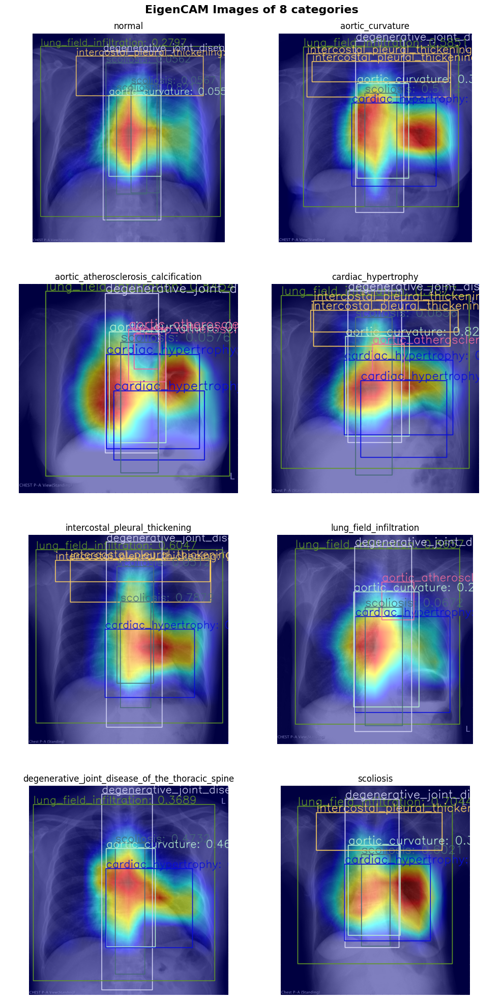

In [140]:
def plot_eigen_cam_images(transforms, model, cat, threshold):
    rows, cols = 4, 2
    fig = plt.figure(figsize=(10, 20))  # Adjust figure size
    grid = plt.GridSpec(rows, cols)
    
    best_ckpt = torch.load("/kaggle/working/final.pth", map_location=config.device)
    model.load_state_dict(best_ckpt["model"])
    model.eval().to(config.device)
    target_layers = [model.backbone]
    
    cam = EigenCAM(model, 
                   target_layers, 
                   reshape_transform=fasterrcnn_reshape_transform)
    
    for i in range(rows * cols):
        all_images = os.listdir(os.path.join(config.root_working, config.categories[i]))        
        image_path = os.path.join(config.root_working, config.categories[i], all_images[0])
        image = Image.open(image_path).convert("RGB")   
        input_tensor = transforms(image)
        input_tensor = input_tensor.to(config.device)
        input_tensor = input_tensor.unsqueeze(0)
        image = np.array(image)
        image_float_np = np.float32(image) / 255
        boxes, classes, labels, indices, scores = predict_cam(input_tensor, model, config.device, threshold)        
        # image = draw_boxes_cam(boxes, labels, classes, image)
        targets = [FasterRCNNBoxScoreTarget(labels=labels, bounding_boxes=boxes)]
        
        grayscale_cam = cam(input_tensor, targets=targets)
        grayscale_cam = grayscale_cam[0, :]
        cam_image = show_cam_on_image(image_float_np, grayscale_cam, use_rgb=True)
        # image_with_bounding_boxes = draw_boxes_cam(boxes, labels, classes, cam_image)
        image_with_bounding_boxes = draw_boxes(boxes, labels, classes, scores, cam_image)
        
        categories = fig.add_subplot(grid[i])
        categories.set_axis_off()
        
        gs = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec=grid[i])
        
        ax = fig.add_subplot(gs[0])
        ax.imshow(image_with_bounding_boxes)
        ax.set_title(f"{config.categories[i]}")
        ax.axis("off")
        
    fig.patch.set_facecolor('white')
    fig.suptitle("EigenCAM Images of 8 categories\n", fontweight='bold', size=16)
    fig.tight_layout()
    fig.subplots_adjust(wspace=0, hspace=0.2)  # Add extra space between plots


plot_eigen_cam_images(transforms = get_transform(), model = fasterrcnn(config.num_classes), cat=0, threshold=0)

## Ablation CAM

消融 activation 並測量輸出的變化，如果輸出大幅下降，表示該 activation 的重要性較高，應該給予其更大的權重。 <br>
速度慢，但對於類別的區分度較好。

100%|██████████| 40/40 [00:43<00:00,  1.08s/it]


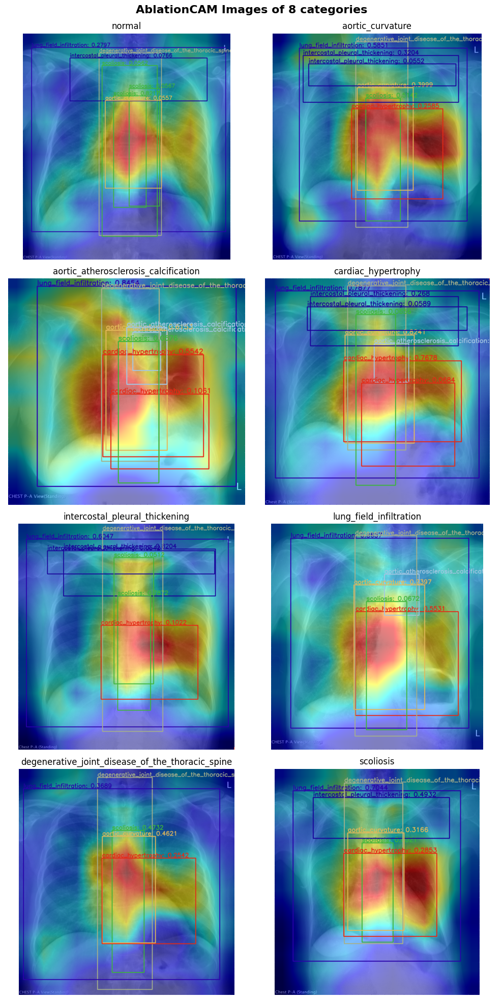

In [120]:
def plot_ablation_cam_images(transforms, model):
    
    rows, cols = 4, 2
    fig = plt.figure(figsize = (10, 20))
    grid = plt.GridSpec(rows, cols)
    
    best_ckpt = torch.load("/kaggle/working/final.pth", map_location=config.device)
    model.load_state_dict(best_ckpt["model"])
    model.eval().to(config.device)
    target_layers = [model.backbone]
    
    cam = AblationCAM(model,
                      target_layers,
                      reshape_transform = fasterrcnn_reshape_transform,
                      ablation_layer = AblationLayerFasterRCNN(),
                      ratio_channels_to_ablate = 1.0)
    
    for i in range(rows * cols):
        
        all_images = os.listdir(os.path.join(config.root_working, config.categories[i]))        
        image_path = os.path.join(config.root_working, config.categories[i], all_images[0])
        image = Image.open(image_path).convert("RGB")       
        input_tensor = transforms(image)
        input_tensor = input_tensor.to(config.device)
        input_tensor = input_tensor.unsqueeze(0)
        image = np.array(image)
        image_float_np = np.float32(image) / 255

        boxes, classes, labels, indices, scores = predict_cam(input_tensor, model, config.device, 0)
        # image = draw_boxes(boxes, labels, classes, image)
        targets = [FasterRCNNBoxScoreTarget(labels = labels, bounding_boxes = boxes)]
        
        grayscale_cam = cam(input_tensor, targets = targets)
        grayscale_cam = grayscale_cam[0, :]
        cam_image = show_cam_on_image(image_float_np, grayscale_cam, use_rgb = True)
        image_with_bounding_boxes = draw_boxes(boxes, labels, classes, scores, cam_image)
        
        categories = fig.add_subplot(grid[i])
        categories.set_axis_off()
        
        gs = gridspec.GridSpecFromSubplotSpec(1, 1, subplot_spec = grid[i])
        
        ax = fig.add_subplot(gs[0])
        ax.imshow(image_with_bounding_boxes)
        ax.set_title(f"{config.categories[i]}")
        ax.axis("off")
        
    fig.patch.set_facecolor('white')
    fig.suptitle("AblationCAM Images of 8 categories\n", fontweight = 'bold', size = 16)
    fig.tight_layout()


plot_ablation_cam_images(transforms = get_transform(), model = fasterrcnn(config.num_classes))

X-ray(train)
(2568, 2096, 3)
圖像大小 (寬, 高): (2096, 2568)
圖像模式: RGB


X-ray(test)
(2576, 2392, 3)
圖像大小 (寬, 高): (2392, 2576)
圖像模式: RGB


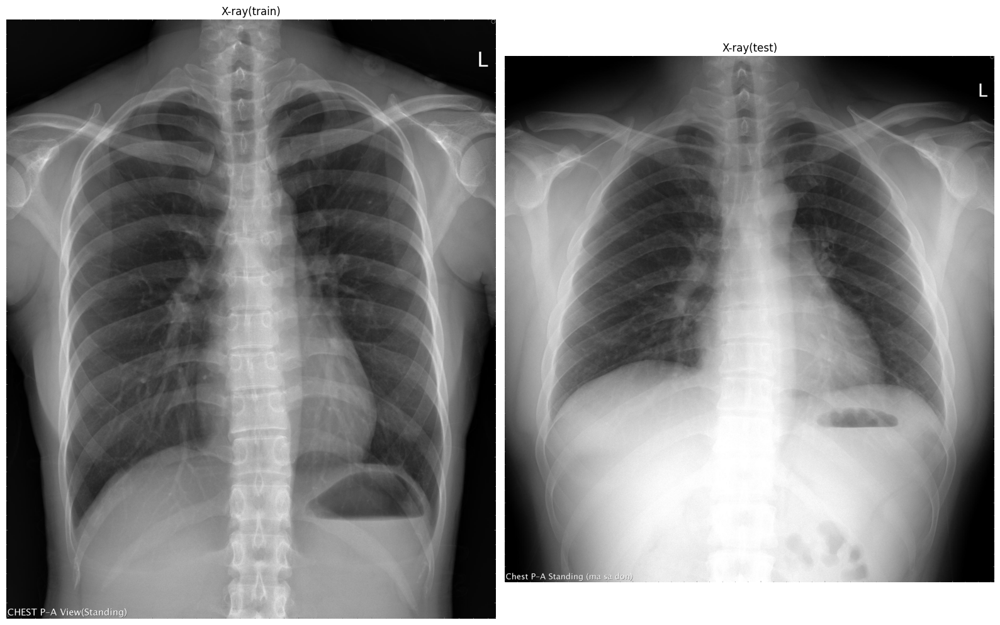

In [148]:
path_train = "/kaggle/working/normal/220.jpg"
path_test = "/kaggle/working/test/004.jpg"
img_train = np.array(Image.open(path_train))
img_test = np.array(Image.open(path_test))


fig, axes = plt.subplots(1, 2, figsize=(16, 16)) 
axes = axes.ravel()
axes[0].imshow(img_train, cmap = "gray") 
axes[0].set_title("X-ray(train)")
axes[0].axis("off")
axes[1].imshow(img_test, cmap = "gray") 
axes[1].set_title("X-ray(test)")
axes[1].axis("off")
fig.tight_layout()
fig.show()

print("X-ray(train)")
print(img_train.shape)
print("圖像大小 (寬, 高):", Image.open(path_train).size)  # (寬, 高)
print("圖像模式:", Image.open(path_train).mode)  # RGB、L（灰階）等

print(f"\n")
print("X-ray(test)")
print(img_test.shape)
print("圖像大小 (寬, 高):", Image.open(path_test).size)  # (寬, 高)
print("圖像模式:", Image.open(path_test).mode)  # RGB、L（灰階）等